# Importación de librerías

In [75]:
#Librerías básicas
import pandas as pd
import numpy as np
import scipy as sp

#Librerías específicas para gráficos
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

#Colores representativos de YouTube y Spotify
color_youtube = '#FF0000'  #*Rojo para YouTube*
color_spotify = '#1DB954'  #*Verde para Spotify*

#Paleta de colores que va desde valores bajos a valores altos en relación con las métricas
colores = [color_youtube, '#FF6600', '#FFCC00', '#FFFF00', '#CCFF00', '#99FF00', '#66FF00', '#33FF00', color_spotify]

#Mapa de colores
num_colores = len(colores)
color_map = LinearSegmentedColormap.from_list('custom', colores)

#Definir los colores a utilizar seaborn
sns.set_palette(colores)

#Librerias
import statsmodels.api as sm
import scipy.stats
from scipy.stats import normaltest
from scipy.stats import anderson
from scipy.stats import skew
from scipy.stats import wilcoxon
from scipy import stats
from scipy.stats import mannwhitneyu
from scipy.stats import kruskal

#Librerias de Metricas
from sklearn import metrics

#Librerias de ML
import lightgbm as lgb
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from imblearn.under_sampling import NearMiss
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


## 1. Importación del dataset

Detalle de las canciones reproducidas de varios artistas del mundo en las plataformas Spotify y Youtube.

In [25]:
dataset = pd.read_csv(r'C:\Users\Alan\Google Drive\Cursos y Capacitaciones\Coderhouse\Data Science\Entregables\1er Pre-entrega\2. Datasets\cleaned_dataset.csv', encoding= 'utf-8')

df= pd.DataFrame(dataset)

### 1.1 Primeros datos

In [26]:
#Dimensión del dataset
dataset.shape

(20594, 24)

In [27]:
#Detalle de las columnas que componen el dataset
dataset.columns

Index(['Artist', 'Track', 'Album', 'Album_type', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Duration_min', 'Title', 'Channel',
       'Views', 'Likes', 'Comments', 'Licensed', 'official_video', 'Stream',
       'EnergyLiveness', 'most_playedon'],
      dtype='object')

In [28]:
#Muestra del dataset
dataset.sample(3)

,Artist,Track,Album,Album_type,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Title,Channel,Views,Likes,Comments,Licensed,official_video,Stream,EnergyLiveness,most_playedon
8689,Manuel Carrasco,Uno X Uno,Bailar El Viento,album,0.602,0.681,-6.976,0.0517,0.468,0.0,...,Manuel Carrasco - Uno X Uno,ManuelCarrascoVEVO,54247539.0,212251.0,5340.0,True,True,73935823.0,10.014706,Spotify
10426,Redimi2,Todo Va a Estar Bien (feat. Evan Craft),20/20,album,0.611,0.376,-7.643,0.1040,0.840,0.0,...,Redimi2 - Todo Va a Estar Bien (Video Oficial)...,redimi2oficial,69839360.0,763569.0,20343.0,True,True,28899174.0,3.481481,Youtube
7155,Alceu Valença,Tropicana (Morena Tropicana),Cavalo De Pau,album,0.640,0.814,-6.701,0.1370,0.118,0.0,...,Alceu Valença - Tropicana (Ao Vivo),GrandeEncontroVEVO,49642645.0,340685.0,6545.0,True,True,54154940.0,3.650224,Spotify


In [29]:
#Determinamos cuantos artistas hay
len(dataset['Artist'].unique())

2074

In [30]:
#Determinamos cuantas canciones hay
len(dataset['Track'].unique())

17717

In [31]:
#Vemos que cantidad de valores nulos tiene por columna y el tipo de los valores de cada una
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20594 entries, 0 to 20593
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20594 non-null  object 
 1   Track             20594 non-null  object 
 2   Album             20594 non-null  object 
 3   Album_type        20594 non-null  object 
 4   Danceability      20594 non-null  float64
 5   Energy            20594 non-null  float64
 6   Loudness          20594 non-null  float64
 7   Speechiness       20594 non-null  float64
 8   Acousticness      20594 non-null  float64
 9   Instrumentalness  20594 non-null  float64
 10  Liveness          20594 non-null  float64
 11  Valence           20594 non-null  float64
 12  Tempo             20594 non-null  float64
 13  Duration_min      20594 non-null  float64
 14  Title             20594 non-null  object 
 15  Channel           20594 non-null  object 
 16  Views             20594 non-null  float6

In [32]:
#Determinamos las columnas numéricas
variaciones_numericas = df.select_dtypes(include=['int','float'])
variaciones_numericas.columns

Index(['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness',
       'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Duration_min',
       'Views', 'Likes', 'Comments', 'Stream', 'EnergyLiveness'],
      dtype='object')

In [33]:
variaciones_numericas.shape

(20594, 15)

In [34]:
#Determinamos las columnas categoricas
variaciones_categoricas = df.select_dtypes(include=['object'])
variaciones_categoricas.columns

Index(['Artist', 'Track', 'Album', 'Album_type', 'Title', 'Channel',
       'Licensed', 'official_video', 'most_playedon'],
      dtype='object')

In [35]:
variaciones_categoricas.shape

(20594, 9)

Descripción de las variables númericas y categoricas

Variables númericas:
* *Danceability*: Expresa la capacidad que una canción tiene de hacer bailar. La canción es más adecuada para bailar cuando los valores son más altos.
* *Energy*: Muestra la intensidad y actividad percibida en una canción. Canciones más enérgicas y vigorosas se identifican por valores más altos.
* *Loudness*: Señala el nivel promedio de volumen de una canción en decibelios (dB). Canciones más fuertes son representadas por valores más altos.
* *Speechiness*: Comparar la cantidad de palabras habladas en una canción con la música instrumental. Una proporción mayor de palabras habladas se refleja en valores más altos.
* *Acousticness*: Indica cuánto una canción es acústica en lugar de electrónica o procesada. Mayores valores indican una presencia más alta de componentes acústicos.
* *Instrumentalness*: Señala si hay elementos musicales instrumentales en una canción. Indican una presencia mayor de música instrumental los valores más elevados.
* *Liveness*: Indica la probabilidad de que una canción haya sido grabada en un concierto. Valores más elevados significan mayor posibilidad de haber sido grabada en vivo.
* *Valence*: Expresa si percibes la canción como positiva o negativa. Canciones con una atmósfera más positiva se indican por valores más altos.
* *Tempo*: Explica cuántos pulsos hay en una canción por minuto (BPM). Canciones más rápidas se indican con valores altos.
* *Duration_min*: El tiempo de duración de la canción en minutos.
* *Views*: El número de visualizaciones que ha obtenido el video musical en YouTube.
* *Likes*: El número de "me gusta" recibido por el video musical en YouTube.
* *Comments*: El número de comentarios que el vídeo musical ha obtenido en YouTube.
* *Stream*: Muestra el número total de reproducciones de la canción en distintas plataformas de streaming.
* *EnergyLiveness*: Un indicador que combina la energía y vivacidad de la canción.

Variables categóricas:
* *Artist*: ¿Cuál es el nombre del artista o grupo que canta la canción?
* *Track*: La canción tiene como título.
* *Album*: El nombre del álbum al cual la canción pertenece.
* *Album_type*: El tipo de álbum puede ser "álbum" para un álbum completo o "sencillo" para una canción individual.
* *Title*: El video musical en YouTube tiene por título.
* *Channel*: El video musical fue subido por el canal de YouTube.
* *Licensed*: Determine si el video musical está licenciado o no.
* *official_video*: ¿El video musical es oficial o no?
* *most_playedon*: Donde se ha reproducido la canción más veces en la plataforma de streaming.

In [36]:
#Comprobamos que no hayan valores duplicados
dataset.duplicated().sum()

0

In [37]:
#Contamos cuantos valores nulos tiene cada columna
dataset.isna().sum()

Artist              0
Track               0
Album               0
Album_type          0
Danceability        0
Energy              0
Loudness            0
Speechiness         0
Acousticness        0
Instrumentalness    0
Liveness            0
Valence             0
Tempo               0
Duration_min        0
Title               0
Channel             0
Views               0
Likes               0
Comments            0
Licensed            0
official_video      0
Stream              0
EnergyLiveness      2
most_playedon       0
dtype: int64

Observamos que la columna EnergyLiveness contienen dos datos nulos, obtamos por corregirlos más adelante

In [38]:
#Vemos que columnas contienen 0 para evaluar si son errores
(dataset == 0).sum()

Artist                 0
Track                  0
Album                  0
Album_type             0
Danceability          19
Energy                 2
Loudness               2
Speechiness           19
Acousticness           2
Instrumentalness    9319
Liveness               2
Valence               28
Tempo                 19
Duration_min           2
Title                  0
Channel                0
Views                470
Likes                557
Comments            1065
Licensed               0
official_video         0
Stream               576
EnergyLiveness         0
most_playedon          0
dtype: int64

Observamos que hay valores en Danceability, Valence , Speechenees, Tempo y EnergyLiveness que no deberían tener 0. Son filas con errores en los datos. Optamos por eliminarlas más adelante.

In [39]:
dataset.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Artist,20594,2074,Gorillaz,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Track,20594,17717,El Ultimo Adiós - Varios Artistas Version,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Album,20594,11854,Greatest Hits,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Album_type,20594,3,album,14834,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Danceability,20594.0,NaN,NaN,NaN,0.620102,0.165504,0.0,0.519,0.638,0.741,0.975
Energy,20594.0,NaN,NaN,NaN,0.635176,0.214274,0.0,0.507,0.666,0.798,1.0
Loudness,20594.0,NaN,NaN,NaN,-7.678254,4.639481,-46.251,-8.868,-6.5405,-4.935,0.92
Speechiness,20594.0,NaN,NaN,NaN,0.096733,0.112182,0.0,0.0357,0.05065,0.104,0.964
Acousticness,20594.0,NaN,NaN,NaN,0.291391,0.286117,0.0,0.0452,0.193,0.47675,0.996
Instrumentalness,20594.0,NaN,NaN,NaN,0.056162,0.193622,0.0,0.0,0.000002,0.000474,1.0


In [40]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Danceability,20594.0,6.201018e-01,1.655042e-01,0.000000,5.190000e-01,6.380000e-01,7.410000e-01,9.750000e-01
Energy,20594.0,6.351761e-01,2.142742e-01,0.000000,5.070000e-01,6.660000e-01,7.980000e-01,1.000000e+00
Loudness,20594.0,-7.678254e+00,4.639481e+00,-46.251000,-8.868000e+00,-6.540500e+00,-4.935000e+00,9.200000e-01
Speechiness,20594.0,9.673305e-02,1.121820e-01,0.000000,3.570000e-02,5.065000e-02,1.040000e-01,9.640000e-01
Acousticness,20594.0,2.913909e-01,2.861171e-01,0.000000,4.520000e-02,1.930000e-01,4.767500e-01,9.960000e-01
Instrumentalness,20594.0,5.616186e-02,1.936215e-01,0.000000,0.000000e+00,2.420000e-06,4.737500e-04,1.000000e+00
Liveness,20594.0,1.936533e-01,1.688321e-01,0.000000,9.410000e-02,1.250000e-01,2.370000e-01,1.000000e+00
Valence,20594.0,5.300769e-01,2.455423e-01,0.000000,3.400000e-01,5.380000e-01,7.270000e-01,9.930000e-01
Tempo,20594.0,1.205626e+02,2.958809e+01,0.000000,9.699400e+01,1.199590e+02,1.399235e+02,2.433720e+02
Duration_min,20594.0,3.742439e+00,2.085211e+00,0.000000,2.996746e+00,3.551267e+00,4.202163e+00,7.793430e+01


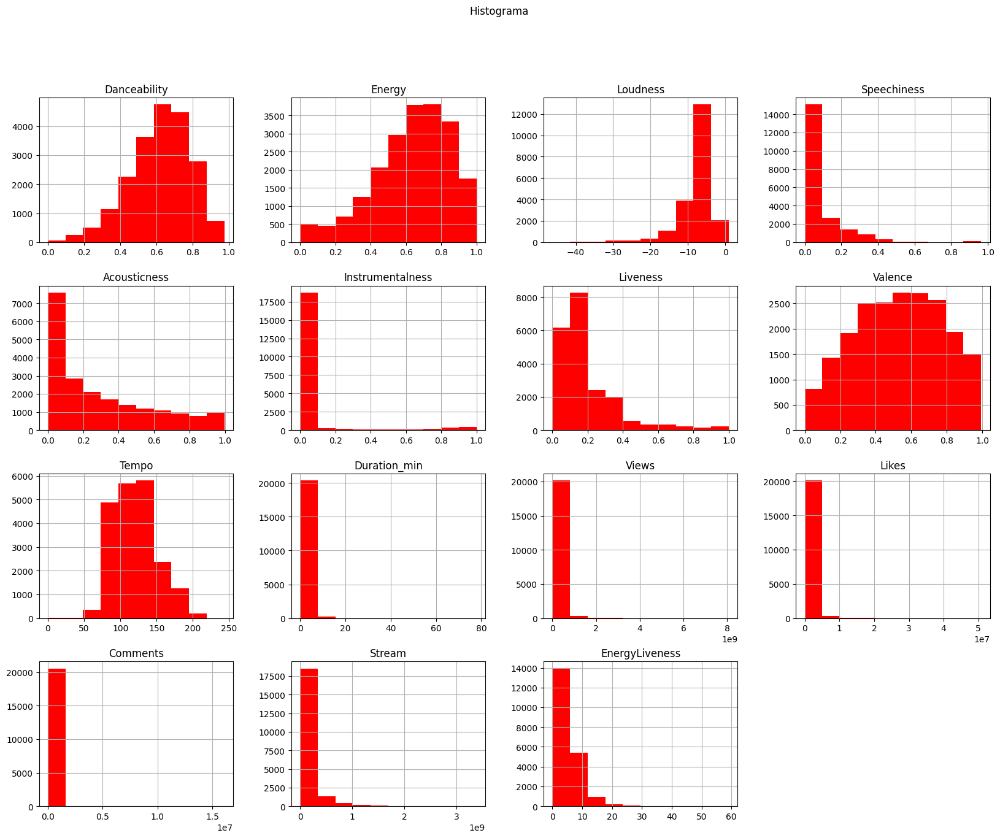

In [41]:
#Graficamos el histograma para comprender mejor las variables númericas
dataset.hist(figsize=(20,15))
plt.suptitle("Histograma")
plt.show()

### Clasificación variables normales o no normales

Para clasificar las variables como *Normales* o *No Normales*, calculamos la diferencia entre el promedio (media) y la mediana (50%). 
Si la diferencia es pequeña, implica que la variable tiene una distribución simétrica y está centrada en torno a la mediana, lo cual indica una distribución *normal*. Si la diferencia es grande, la distribución puede ser asimétrica y no estar centrada en la mediana, lo que sugiere una distribución *no normal*.

Estas variables tienen diferencias relativamente poco significativas entre la media y la mediana, lo que sugiere distribuciones más simétricas:
 * Danceability: Media= 0,6201018 Mediana= 0,638 variable: NORMAL
 * Energy: Media= 0,6351761 Mediana= 0,666 variable: NORMAL
 * Liveness: Media= 0,1936533 Mediana= 0,125 variable: NORMAL
 * Valence: Media= 0,5300769 Mediana= 0,538 variable: NORMAL
 * Duration_min: Media= 3,742439 Mediana= 3,551267 variable: NORMAL

Estas variables tienen diferencias significativas entre la media y la mediana, lo que sugiere distribuciones sesgadas o asimétricas:
 * Loudness: Media= -7,678254 Mediana= -6,5405 variable: NO NORMAL
 * Speechiness: Media= 0,09673305 Mediana= 0,05065 variable: NO NORMAL
 * Acousticness: Media= 0,2913909 Mediana= 0,193 variable: NO NORMAL
 * Instrumentalness: Media= 0,05616186 Mediana= 0,00000242 variable: NO NORMAL
 * Tempo: Media= 120,5626 Mediana= 119,959 variable: NO NORMAL
 * Views: Media= 92037400 Mediana= 13313480 variable: NO NORMAL
 * Likes: Media= 647990,2 Mediana= 115315,5 variable: NO NORMAL
 * Comments: Media= 26846,79 Mediana= 3006 variable: NO NORMAL
 * Stream: Media= 132644600 Mediana= 47305250 variable: NO NORMAL
 * EnergyLiveness: Media= 5,167227 Mediana= 4,256881 variable: NO NORMAL


1.3 Resumen del Dataset:
 * Columnas: 24
 * Filas: 20594
 * Tipos de datos:  Object y float
 * Variables númericas: 15
 * Variables categóricas: 9
 * Variables númericas normales: 5 *(Danceability, Energy, Liveness, Valance, Duration_min)*
 * Variables númericas no normales: 10 *(Loudness, Speechiness, Acousticness, Instrumentalness, Tempo, Views, Likes, Comments, Stream, EnergyLiveness)*
 * Columnas con valores nulos: 1 *(EnergyLiveness)*

## Tratamiento del dataset

En función de las primeras observaciones del dataset, se procede a realizar las siguientes tareas:
 * Se crea copia del dataset para no perder información. 
 * Se agrega columna artista-canción.
 * Se eliminan las columnas que no aportan información.
 * Se traducen las columnas para que tengan un nombre más entendible.
 * Se corrigen columnas con valores nulos.
 * Se analizan los outliers.

In [33]:
#Creamos una copia del dataset para analizar los datos
dataset_analisis= dataset.copy()

In [34]:
#Creamos la columna Artista-Canción para saber de que artista es cada canción
dataset_analisis['Artista-Canción'] = dataset_analisis.apply(lambda row: '-'. join([row['Title'],row['Artist']]), axis=1)

#### Columnas que no aportan información

In [35]:
#Borramos las columnas que no aportan información
columnas_delete= ['Licensed','official_video']
dataset_analisis.drop(columnas_delete, axis=1, inplace= True)

dataset_analisis.columns

Index(['Artist', 'Track', 'Album', 'Album_type', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Duration_min', 'Title', 'Channel',
       'Views', 'Likes', 'Comments', 'Stream', 'EnergyLiveness',
       'most_playedon', 'Artista-Canción'],
      dtype='object')

#### Traducción de los encabezados

In [36]:
#Renombramos las columnas del DataFrame con nombres en español
nombres_spanish = ['Artista', 'Canción', 'Album', 'Tipo_album', 'Bailabilidad', 'Energía',
                   'Sonoridad', 'Hablabilidad', 'Acústica', 'Instrumentalidad',
                   'Vivacidad', 'Emoción', 'Tempo', 'Duración_min', 'Título', 'Canal',
                   'Vistas', 'Me gusta', 'Comentarios', 'Reproducciones','Vitalidad','Más_Reproducido']

# Utilizamos rename para renombrarlas y Zip para que recorra las columnas de df
dataset_analisis = dataset_analisis.rename(columns= dict(zip(dataset_analisis.columns, nombres_spanish)))
dataset_analisis.columns

Index(['Artista', 'Canción', 'Album', 'Tipo_album', 'Bailabilidad', 'Energía',
       'Sonoridad', 'Hablabilidad', 'Acústica', 'Instrumentalidad',
       'Vivacidad', 'Emoción', 'Tempo', 'Duración_min', 'Título', 'Canal',
       'Vistas', 'Me gusta', 'Comentarios', 'Reproducciones', 'Vitalidad',
       'Más_Reproducido', 'Artista-Canción'],
      dtype='object')

#### Columnas con valores nulos

In [37]:
dataset_analisis.isna().sum()

Artista             0
Canción             0
Album               0
Tipo_album          0
Bailabilidad        0
Energía             0
Sonoridad           0
Hablabilidad        0
Acústica            0
Instrumentalidad    0
Vivacidad           0
Emoción             0
Tempo               0
Duración_min        0
Título              0
Canal               0
Vistas              0
Me gusta            0
Comentarios         0
Reproducciones      0
Vitalidad           2
Más_Reproducido     0
Artista-Canción     0
dtype: int64

In [38]:
#Calculamos el promedio de "Vitalidad"por artista
#Utilizamos el método 'groupby' y luego calculamos la media

artista_media_vitalidad = dataset_analisis.groupby('Artista')['Vitalidad'].mean() 

In [39]:
#Rellenamos los valores nulos con el promedio por artista obtenido
#Utilizamos el metodo 'map' para mapear los valores promedio correspondientes a cada artista

dataset_analisis['Vitalidad'] = dataset_analisis['Vitalidad'].fillna(dataset_analisis['Artista'].map(artista_media_vitalidad))

In [40]:
#Validamos que el dataset no contenga datos nulos
dataset_analisis.isna().sum()

Artista             0
Canción             0
Album               0
Tipo_album          0
Bailabilidad        0
Energía             0
Sonoridad           0
Hablabilidad        0
Acústica            0
Instrumentalidad    0
Vivacidad           0
Emoción             0
Tempo               0
Duración_min        0
Título              0
Canal               0
Vistas              0
Me gusta            0
Comentarios         0
Reproducciones      0
Vitalidad           0
Más_Reproducido     0
Artista-Canción     0
dtype: int64

## Análisis de outliers

**Duración**
Tiempo que dura el tema

In [41]:
dataset_analisis['Duración_min'].describe()

count    20594.000000
mean         3.742439
std          2.085211
min          0.000000
25%          2.996746
50%          3.551267
75%          4.202163
max         77.934300
Name: Duración_min, dtype: float64

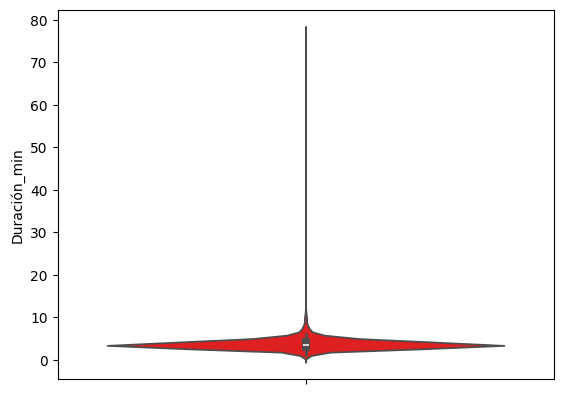

In [43]:
#Para visualizar los outliers se crea el diagrama de violín
sns.violinplot(y=dataset_analisis['Duración_min'])
plt.show()

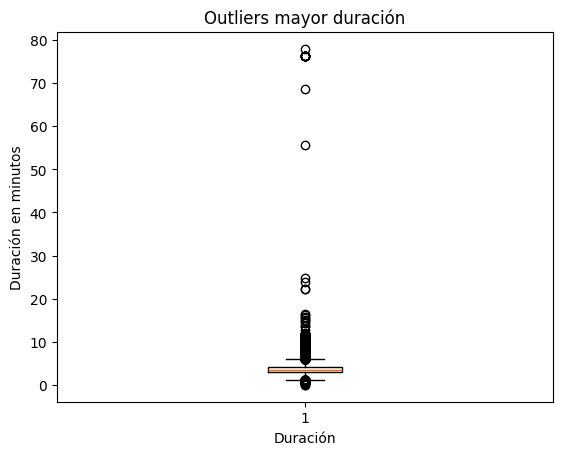

In [44]:
#Creamos un gráfico de caja, para ver como outliers las canciones de mayor duración
plt.boxplot(dataset_analisis['Duración_min'])

#Diseño de gráfico
plt.xlabel("Duración")
plt.ylabel("Duración en minutos")
plt.title("Outliers mayor duración")
plt.show()

In [45]:
#Creamos el DF duración para analizar el tiempo de duración de las canciones
duracion = dataset_analisis.groupby(['Título','Artista'])[['Duración_min']].max().sort_values(['Duración_min'], ascending=True)
duracion

Duración_min
Título                                             Artista                          
Natasha Bedingfield - These Words (Official Video) Natasha Bedingfield      0.000000
Steven Universe Future Official Soundtrack | St... Estelle                  0.516417
Relaxing Baby White Noise Piano                    Sleepy Penguin           0.516667
Sleepy Penguin                                     Sleepy Penguin           0.516667
White Noise Baby Sleep Melody                      Sleepy Penguin           0.516667
...                                                                              ...
52 Non Stop Dilbar Dilbar Remix By Kedrock, SD ... Mika Singh              76.358050
                                                   Tulsi Kumar             76.358050
                                                   Ankit Tiwari            76.358050
                                                   Yo Yo Honey Singh       76.358050
High Rated Gabru 52 Non Stop Hits (Remix By Man... Harshdeep Kaur          77.934300

[19651 rows x 1 columns]

In [89]:

duracion[duracion['Duración_min']>10].sort_values(['Duración_min'], ascending=True)

Duración_min
Título                                             Artista                              
Bushido - Leben und Tod des Kenneth Glöckler       Bushido                     10.016667
Gladiator Soundtrack : "The Battle".               Gavin Greenaway             10.037117
                                                   The Lyndhurst Orchestra     10.037117
Lisa Gerrard - Now We Are Free - ORIGINAL Music... Lisa Gerrard                10.037117
Poesia Acústica #9 - Melhor Forma - L7NNON | CH... L7NNON                      10.184617
...                                                                                  ...
52 Non Stop Dilbar Dilbar Remix By Kedrock, SD ... Amaal Mallik                76.358050
                                                   Divya Kumar                 76.358050
                                                   Amit Trivedi                76.358050
                                                   Guru Randhawa               76.358050
High Rated Gabru 52 Non Stop Hits (Remix By Man... Harshdeep Kaur              77.934300

[74 rows x 1 columns]

In [112]:
duracion[duracion['Duración_min']<1.0].sort_values(['Duración_min'], ascending=True)

,,Duración_min
Título,Artista,
Natasha Bedingfield - These Words (Official Video),Natasha Bedingfield,0.000000
Steven Universe Future Official Soundtrack | Steven Universe Future (Opening Theme) / Title Card,Estelle,0.516417
Relaxing Baby White Noise Piano,Sleepy Penguin,0.516667
Sleepy Penguin,Sleepy Penguin,0.516667
White Noise Baby Sleep Melody,Sleepy Penguin,0.516667
Gentle White Noise Piano Melodies,Sleepy Penguin,0.516667
Colicky Baby Sleeps To This Magic Sound | White Noise 10 Hours | Soothe crying infant,Sleepy Penguin,0.516667
White Noise Gentle Piano,Sleepy Penguin,0.516667
Neue Freunde - Intro,Thomas Karallus,0.523950


Observamos que hay un total de 76 canciones, de las cuales 40 no fueron realizadas por artistas

**HABLABILIDAD**

**Hablabilidad:** Detecta la presencia de palabras habladas en una pista. Cuanto más exclusivamente se asemeje la grabación a palabras habladas (por ejemplo, un programa de entrevistas, un audiolibro, poesía), más cercano a 1.0 será el valor del atributo. 

Analizando: 
- Speechiness > 0.66 Audiolibros o relatos. 

- Los valores entre 0.10 y 0.66 son canciones donde predomina la voz, por lo general géneros como rap y trap. 

- Los valores inferiores a 0.10 representan canciones más melódicas

In [46]:
#Hacemos un describe para comprender los valores
dataset_analisis['Hablabilidad'].describe()

count    20594.000000
mean         0.096733
std          0.112182
min          0.000000
25%          0.035700
50%          0.050650
75%          0.104000
max          0.964000
Name: Hablabilidad, dtype: float64

In [47]:
#Creamos el DF Speech para analizar la hablabilidad
speech = dataset_analisis.groupby(['Título', 'Artista'])[['Hablabilidad']].max().sort_values(['Hablabilidad'], ascending=False)
speech

,,Hablabilidad
Título,Artista,
Sherlock Holmes e l'ultimo saluto - Arthur Conan Doyle,Sir Arthur Conan Doyle,0.964
Sherlock Holmes e il mistero di Boscombe Valley - Arthur Conan Doyle,Sir Arthur Conan Doyle,0.962
Bibi Blocksberg - Der Hexenbesenausflug (Folge 146) | EXTRALANGE Hörprobe,Bibi Blocksberg,0.961
0,Bibi Blocksberg,0.961
Die sieben Todsünden (Der Sherlock Holmes Adventkalender 2022 – Teil 14) Krimi Hörbuch,Sherlock Holmes,0.960
...,...,...
M83 - Adieux (audio),M83,0.000
"White Noise Relaxation for Calming Down Fussy Infant Baby, Sleepy Toddler or Child",White Noise Baby Sleep,0.000
Baby Sleep Brown Noise,White Noise Baby Sleep,0.000


In [48]:
#Analizamos los valores bajos de hablabilidad
speech[(speech['Hablabilidad']<0.02)].sort_values(['Hablabilidad'], ascending=True)

Hablabilidad
Título                                             Artista                             
beach waves and soothing brown noise               Ocean Waves For Sleep            0.0
Air Conditioner - Loopable With No Fade            White Noise Baby Sleep           0.0
                                                   White Noise for Babies           0.0
Brown Noise, Black Screen ??? • 12 hours • No ads  White Noise for Babies           0.0
Louis Armstrong - Hello Dolly                      Louis Armstrong                  0.0
Richter: The Departure                             Lang Lang                        0.0
beach waves and soothing brown noise               Ocean Sounds                     0.0
Clean White Noise - Loopable With No Fade          White Noise Baby Sleep           0.0
Natasha Bedingfield - These Words (Official Video) Natasha Bedingfield              0.0
Shower Sound - Loopable Without Fade               White Noise for Babies           0.0
Arrival                                            The Alchemist                    0.0
M83 - Adieux (audio)                               M83                              0.0
White Noise Relaxation for Calming Down Fussy I... White Noise Baby Sleep           0.0
Baby Sleep Brown Noise                             White Noise Baby Sleep           0.0
White Noise Black Screen | Sleep, Study, Focus ... White Noise for Babies           0.0
Clean White Noise - Loopable With No Fade          White Noise for Babies           0.0

In [94]:
#Analizamos los valores altos de hablabilidad
speech[(speech['Hablabilidad']>0.68)].sort_values(['Hablabilidad'], ascending=True)

,,Hablabilidad
Título,Artista,
The Backyardigans - Castaways (Lyrics) | castaways we are castaways ahoy there ahoy we are castaways,D.O.E.,0.701
Drachenzähmen leicht gemacht 3 - Teil 4,Thomas Karallus,0.709
Let Go (Acapella),Dina Rae,0.714
A Boogie Wit Da Hoodie - Jungle (Prod. by D Stackz / Dir. by Gerard Victor) [Official Music Video],A Boogie Wit da Hoodie,0.737
Drachenzähmen leicht gemacht - Teil 3,Thomas Karallus,0.770
...,...,...
Die sieben Todsünden (Der Sherlock Holmes Adventkalender 2022 – Teil 14) Krimi Hörbuch,Sherlock Holmes,0.960
0,Bibi Blocksberg,0.961
Bibi Blocksberg - Der Hexenbesenausflug (Folge 146) | EXTRALANGE Hörprobe,Bibi Blocksberg,0.961


Vemos que los valores con hablabilidad muy altos son audio libros y los valores con hablabilidad muy bajos son White Noise.<br>
 - Hablabilidad < 0.2 son audiolibros o whithe noice (Ruido instrumental para relajación) <br>
 - Hablabilidad > 0.68 son audiolibros<br>

**Instrumentalidad**

**Instrumentalidad:** Se utiliza para estimar si una pista es instrumental o contiene voces. Valores cercanos a 1.0 indican una alta probabilidad de que la pista sea completamente instrumental, mientras que valores por encima de 0.5 también sugieren pistas instrumentales, pero con mayor confianza a medida que se acercan a 1.0.

In [50]:
#Hacemos un describe para comprender los valores
dataset_analisis['Instrumentalidad'].describe()

count    20455.000000
mean         0.055836
std          0.192667
min          0.000000
25%          0.000000
50%          0.000003
75%          0.000486
max          0.995000
Name: Instrumentalidad, dtype: float64

**Acústica**

Sirve para medir la probabilidad de que una pista sea acústica. Es una medida de confianza que varía de 0.0 a 1.0. Un valor de 1.0 indica una alta confianza de que la pista es completamente acústica, es decir, que se interpreta utilizando instrumentos musicales acústicos en lugar de instrumentos electrónicos o amplificados.

In [51]:
#Hacemos un describe para comprender los valores
dataset_analisis['Acústica'].describe()

count    20455.000000
mean         0.290081
std          0.285892
min          0.000001
25%          0.044650
50%          0.191000
75%          0.474000
max          0.996000
Name: Acústica, dtype: float64

In [52]:
#Creamos el DF acustica para analizar la Acustica
acustica = dataset_analisis.groupby(['Título','Artista'])[['Acústica']].max().sort_values(['Acústica'], ascending=True)
acustica

,,Acústica
Título,Artista,
Constant Broad Spectrum Noise Loop to Drown Out Sounds & Loud City Noises,White Noise Baby Sleep,0.000001
Stone Temple Pilots - Sex Type Thing (Official Music Video),Stone Temple Pilots,0.000001
VOLBEAT - Becoming (Official Music Video),Volbeat,0.000002
IN FLAMES - Only For The Weak (OFFICIAL MUSIC VIDEO),In Flames,0.000002
Gojira-The Heaviest Matter of the Universe (Unofficial Video),Gojira,0.000003
...,...,...
"Schumann: Kinderszenen, Op. 15 - 10. Fast zu ernst",Robert Schumann,0.996000
Wet Hands,C418,0.996000
you're in love - Joe hisaishi (Extended version),Joe Hisaishi,0.996000


In [53]:
#Analizamos los valores altos de acústica
acustica[(acustica['Acústica']>0.99)].sort_values(['Acústica'], ascending=True)

,,Acústica
Título,Artista,
Ludovico Einaudi - Temple White (Performance Video),Ludovico Einaudi,0.991
"Chopin - Nocturne no. 19 in E minor, op. posth. 72 no. 1 - Takagi Ryoma",Frédéric Chopin,0.991
Patrick Watson - The Great Escape (Official Video),Patrick Watson,0.991
Yann Tiersen - Comptine d`un autre ete - l`apres-midi,Yann Tiersen,0.991
"Eric Lu – Chopin: Preludes, Op. 28: No. 4 in E Minor, Largo",Frédéric Chopin,0.991
...,...,...
P.S. I Love You,John Powell,0.996
The Departure (Extended),Max Richter,0.996
"Grieg Lyric Pieces Book I, Op.12 - 1. Arietta",Edvard Grieg,0.996


In [100]:
#Analizamos los valores bajos de acústica
acustica[(acustica['Acústica']<0.0001)].sort_values(['Acústica'], ascending=True)

,,Acústica
Título,Artista,
Constant Broad Spectrum Noise Loop to Drown Out Sounds & Loud City Noises,White Noise Baby Sleep,0.000001
Stone Temple Pilots - Sex Type Thing (Official Music Video),Stone Temple Pilots,0.000001
VOLBEAT - Becoming (Official Music Video),Volbeat,0.000002
IN FLAMES - Only For The Weak (OFFICIAL MUSIC VIDEO),In Flames,0.000002
Gojira-The Heaviest Matter of the Universe (Unofficial Video),Gojira,0.000003
...,...,...
Mötley Crüe - Live Wire (Official Music Video),Mötley Crüe,0.000094
Ghost - Mary On A Cross (slowed + reverb) (Official Audio),Ghost,0.000094
M83 - 'Oceans Niagara' (Official Music Video),M83,0.000094


Vemos que los valores con acústicas muy altos son conciertos instrumentales o soundtracks de películas y los valores con acústica muy bajos son temas con arreglos electrónicos o white noice.<br>
 - Hablabilidad > 0.99 son audiolibros<br>
 - Hablabilidad < 0.0001 son temas con instrumentos eléctricos o whithe noice (Ruido instrumental para relajación) <br>
 

# Limpieza de datos

Eliminaremos aquellos datos que no nos sirven para el análisis

Eliminar outliers - Duración

In [54]:
#Eliminamos los outliers (canciones mayores a 10 minutos y menores a 1 minuto)
dataset_analisis = dataset_analisis.drop(dataset_analisis[dataset_analisis['Duración_min']>10].index)
dataset_analisis = dataset_analisis.drop(dataset_analisis[dataset_analisis['Duración_min']<1.0].index)

Eliminar outliers - Hablabilidad

In [55]:
# Armamos un df con los valores de Hablabilidad que no nos sirven
hablabilidad_mal = dataset_analisis[(dataset_analisis['Hablabilidad'] < 0.02) | (dataset_analisis['Hablabilidad'] > 0.68)].sort_values('Hablabilidad')
# Con drop eliminamos los valores del Dataframe
dataset_analisis= dataset_analisis.drop(dataset_analisis[(dataset_analisis['Hablabilidad'] < 0.02) | (dataset_analisis['Hablabilidad'] > 0.68)].index)

In [58]:
#buscamos los artistas y canciones que incluyan white noise o meditation
white_noise = dataset_analisis[(dataset_analisis["Canción"].str.contains("white noise")) | (dataset_analisis["Artista"].str.contains("white noise"))]
#con drop eliminamos los valores del dataframe
dataset_analisis= dataset_analisis.drop(white_noise.index)
# artistas que se llamen sound son sonidos
sound = dataset_analisis[dataset_analisis["Artista"].str.contains("sound")]
# con drop eliminamos los valores del dataframe
dataset_analisis= dataset_analisis.drop(sound.index)
# artistas que se llamen sleep son sonidos para dormir
sleep = dataset_analisis[dataset_analisis["Artista"].str.contains("sleep")]
sleep
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(sleep.index)
# albumes con nombre que incluyan "motion picture" para descartar bandas sonoras de peliculas
motion_picture= dataset_analisis[dataset_analisis['Album'].str.contains("motion picture")]
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(motion_picture.index)
# albumes que contengan el nombre "soundtrack" hacen referencia a la banda sonora de una pelicula 
soundtrack = dataset_analisis[dataset_analisis['Album'].str.contains("soundtrack")]
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(soundtrack.index)
# albumes que contengan el nombre "movie" hacen referencia a la banda sonora de una pelicula
movie = dataset_analisis[dataset_analisis['Album'].str.contains("movie")]
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(movie.index)
# buscamos el df con sonidos de peliculas de hbo
hbo = dataset_analisis[dataset_analisis['Album'].str.contains("hbo")]
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(hbo.index)
# albumes con banda sonora del juego minecraft
minecraft = dataset_analisis[dataset_analisis['Album'].str.contains("minecraft")]
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(minecraft.index)
# albumes que contengan la palabra meditation
meditation = dataset_analisis[dataset_analisis['Album'].str.contains("meditation")]
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(meditation.index)
# albumes que contengan la palabra dna repair
dna_repair = dataset_analisis[dataset_analisis['Album'].str.contains("dna repair")]
# albumes que contengan la palabra last - sale soundtruck del juego tlou
dataset_analisis = dataset_analisis.drop(dna_repair.index)
last = dataset_analisis[dataset_analisis['Album'].str.contains("the last of us")]
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(last.index)
# albumes que contengan la palabra "folge" (episodio en aleman)
folge = dataset_analisis[dataset_analisis['Album'].str.contains("folge")]
# con drop eliminamos los valores del dataframe
dataset_analisis = dataset_analisis.drop(folge.index)

In [59]:
dataset_analisis.shape

(20325, 23)

# EDA - Análsis Exploratorio de datos

# Análisis de estadísticos

## Bivariado 

1.1.1. Danceability vs. Views

In [101]:
#Filtramos el DF para incluir solo las filas donde el canal sea YouTube o Spotify
youtube_views = df[df['most_playedon'] == 'Youtube']
spotify_views = df[df['most_playedon'] == 'Spotify']

vistas_youtube = youtube_views.groupby('most_playedon')['Views'].sum().reset_index()
vistas_spotify = spotify_views.groupby('most_playedon')['Views'].sum().reset_index()

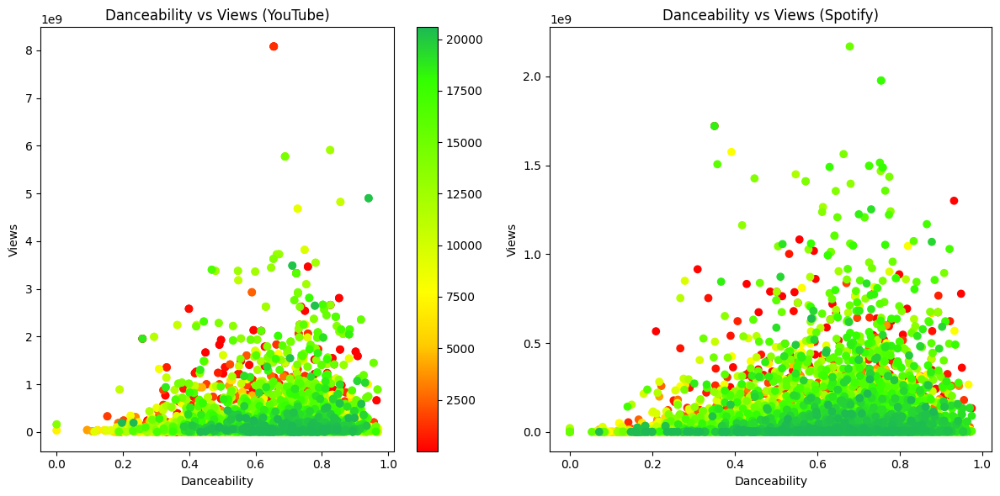

In [102]:
#Creamos una figura y una cuadrícula de subgráficos con dos columnas
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

#Creamos el gráfico de dispersión y lo asignamos a la variable scatter_plot
scatter_plot = axs[0].scatter(youtube_views['Danceability'], youtube_views['Views'], c=youtube_views.index, cmap=color_map)
fig.colorbar(scatter_plot, ax=axs[0])

#Primer gráfico
axs[0].scatter(youtube_views['Danceability'], youtube_views['Views'], c=youtube_views.index, cmap=color_map)
axs[0].set_title('Danceability vs Views (YouTube)')
axs[0].set_xlabel('Danceability')
axs[0].set_ylabel('Views')
axs[0].grid(False)

#Segundo gráfico
axs[1].scatter(spotify_views['Danceability'], spotify_views['Views'], c=spotify_views.index, cmap=color_map)
axs[1].set_title('Danceability vs Views (Spotify)')
axs[1].set_xlabel('Danceability')
axs[1].set_ylabel('Views')
axs[1].grid(False)

#Ajuste espacio entre los gráficos
plt.tight_layout()

#Mostrar los gráficos
plt.show()

In [103]:
correlacion_youtube_views= youtube_views['Danceability'].corr(youtube_views['Views'])
print(f'Correlación entre Danceability y Views en YouTube: {correlacion_youtube_views}')

correlacion_spotify_views= spotify_views['Danceability'].corr(spotify_views['Views'])
print(f'Correlación entre Danceability y Views en Spotify: {correlacion_spotify_views}')

Correlación entre Danceability y Views en YouTube: 0.08557352522466252
Correlación entre Danceability y Views en Spotify: 0.08270162719079512


Podemos concluir que en los canales YouTube y Spotify, existe una correlación débil pero positiva entre la bailabilidad de la música y el número de reproducciones. Esto indica que las canciones más bailables suelen tener más visualizaciones en ambos canales, aunque otros factores también pueden afectar la cantidad de reproducciones.


1.1.2. Energy vs. Likes

In [104]:
#Filtramos el DF para incluir solo las filas donde el canal sea YouTube o Spotify
youtube_likes = df[df['most_playedon'] == 'Youtube']
spotify_likes = df[df['most_playedon'] == 'Spotify']

likes_youtube = youtube_likes.groupby('most_playedon')['Likes'].sum().reset_index()
likes_spotify = spotify_likes.groupby('most_playedon')['Likes'].sum().reset_index()

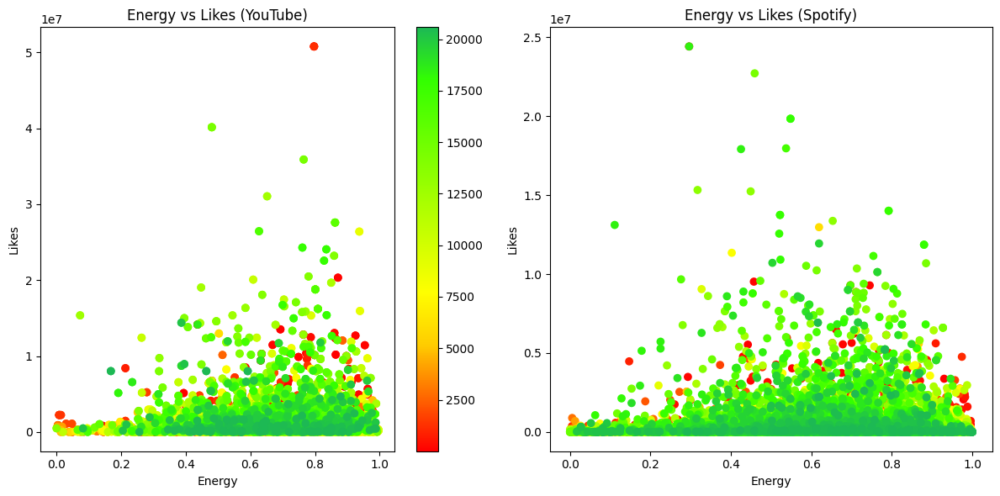

In [105]:
#Creamos una figura y una cuadrícula de subgráficos con dos columnas
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

#Creamos el gráfico de dispersión y lo asignamos a la variable scatter_plot
scatter_plot = axs[0].scatter(youtube_likes['Energy'], youtube_likes['Likes'], c=youtube_likes.index, cmap=color_map)
fig.colorbar(scatter_plot, ax=axs[0])

#Primer gráfico
axs[0].scatter(youtube_likes['Energy'], youtube_likes['Likes'], c=youtube_likes.index, cmap=color_map)
axs[0].set_title('Energy vs Likes (YouTube)')
axs[0].set_xlabel('Energy')
axs[0].set_ylabel('Likes')
axs[0].grid(False)

#Segundo gráfico
axs[1].scatter(spotify_likes['Energy'], spotify_likes['Likes'], c=spotify_likes.index, cmap=color_map)
axs[1].set_title('Energy vs Likes (Spotify)')
axs[1].set_xlabel('Energy')
axs[1].set_ylabel('Likes')
axs[1].grid(False)

#Ajuste espacio entre los gráficos
plt.tight_layout()

#Mostrar los gráficos
plt.show()

In [106]:
correlacion_youtube_likes= youtube_likes['Energy'].corr(youtube_likes['Likes'])
print(f'Correlación entre Energy y Likes en YouTube: {correlacion_youtube_likes}')

correlacion_spotify_likes= spotify_likes['Energy'].corr(spotify_likes['Likes'])
print(f'Correlación entre Energy y Likes en Spotify: {correlacion_spotify_likes}')

Correlación entre Energy y Likes en YouTube: 0.06895976875975224
Correlación entre Energy y Likes en Spotify: 0.041247818455680436


Entedemos que en los canales YouTube y Spotify, existe una correlación débil pero positiva entre la energía de la música y la cantidad de likes. Esto indica que las canciones más enérgicas suelen tener mayor cantidad de likes en ambos canales, aunque otros factores también pueden afectar la cantidad de reproducciones.

1.2. Comparación entre canales:
* 1.2.1 ¿Existen diferencias significativas en la "Energy" de las canciones según el canal de publicación?
* 1.2.2.¿La "Valence" de las canciones varía entre los canales de YouTube y Spotify?

1.2.1 Energy por canal *(Youtube/Spotify)*

In [6]:
#Filtramos el DF para incluir solo las filas donde el canal sea YouTube o Spotify
youtube_energy = df[df['most_playedon'] == 'Youtube']
spotify_energy = df[df['most_playedon'] == 'Spotify']

energia_youtube = youtube_energy.groupby('most_playedon')['Energy'].sum().reset_index()
energia_spotify = spotify_energy.groupby('most_playedon')['Energy'].sum().reset_index()

In [13]:
print(energia_youtube)
print(energia_spotify)

  most_playedon      Energy
0       Youtube  3242.41023
  most_playedon       Energy
0       Spotify  9838.405804


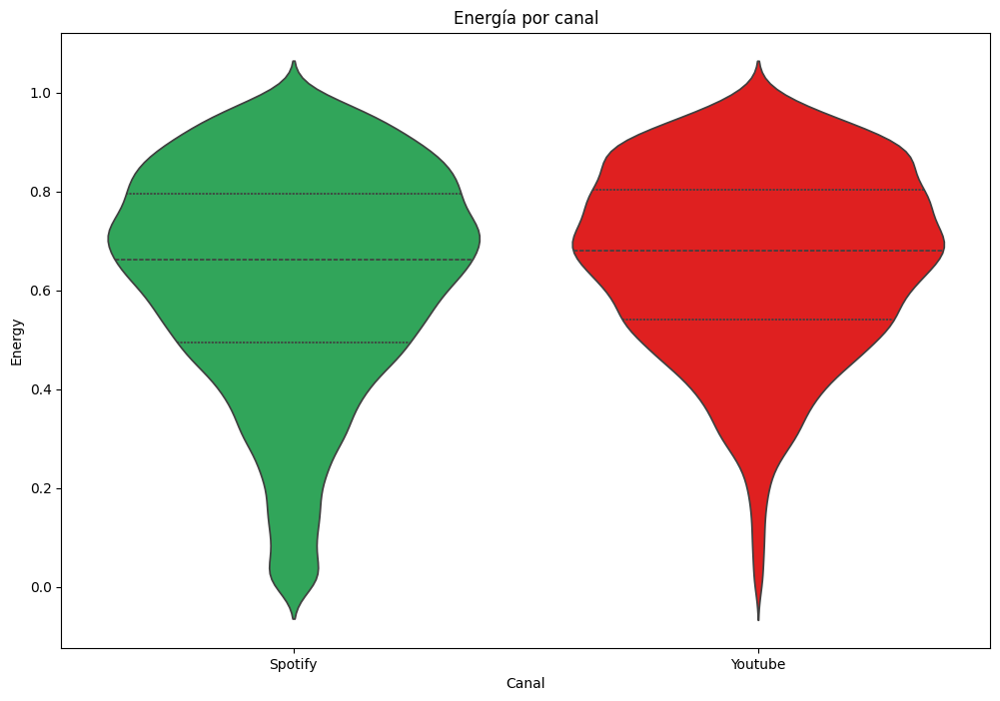

In [37]:
color_energy=["#1DB954","#FF0000"]

plt.figure(figsize=(12, 8))
sns.violinplot(x='most_playedon', y='Energy', data=dataset, inner = "quartile", hue='most_playedon', palette = color_energy, legend=False)
plt.title('Energía por canal')
plt.xlabel('Canal')
plt.ylabel('Energy')
plt.show()

DE lo analizado previamente, podemos concluir que no existen diferencias significativas en la variable *Energy* entre los canales *YouTube* y *Spotify*.

1.2.2. Valence por canal *(YouTube/Spotify)*

In [45]:
#Filtramos el DF para incluir solo las filas donde el canal sea YouTube o Spotify
youtube_valence = df[df['most_playedon'] == 'Youtube']
spotify_valence = df[df['most_playedon'] == 'Spotify']

In [48]:
youtube_valence['Valence'].describe()

count    4900.000000
mean        0.565693
std         0.233723
min         0.000000
25%         0.381000
50%         0.580000
75%         0.753000
max         0.982000
Name: Valence, dtype: float64

In [49]:
spotify_valence['Valence'].describe()

count    15694.000000
mean         0.518957
std          0.248080
min          0.000000
25%          0.326000
50%          0.523000
75%          0.717000
max          0.993000
Name: Valence, dtype: float64

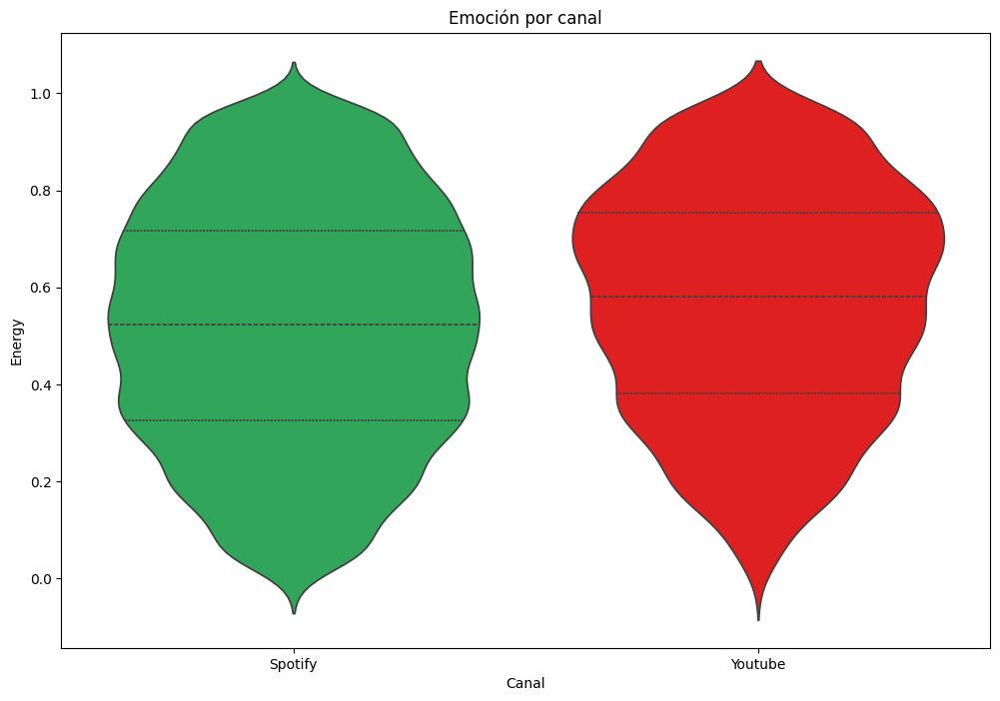

In [50]:
color_energy=["#1DB954","#FF0000"]

plt.figure(figsize=(12, 8))
sns.violinplot(x='most_playedon', y='Valence', data=dataset, inner = "quartile", hue='most_playedon', palette = color_energy, legend=False)
plt.title('Emoción por canal')
plt.xlabel('Canal')
plt.ylabel('Energy')
plt.show()

## Univariado 

* *Danceability*: Expresa la capacidad que una canción tiene de hacer bailar. La canción es más adecuada para bailar cuando los valores son más altos.

In [51]:
#Descripción estadística de la varible
dataset['Danceability'].describe()

count    20594.000000
mean         0.620102
std          0.165504
min          0.000000
25%          0.519000
50%          0.638000
75%          0.741000
max          0.975000
Name: Danceability, dtype: float64

In [55]:
#Detallamos las canciones con mayor bailabilidad
bailabilidad= (dataset.groupby(['Track','Artist'])[['Danceability']].max()).sort_values(by='Danceability', ascending=False).head(10)
bailabilidad

Danceability
Track                                           Artist                   
Give It To Me                                   Timbaland           0.975
CAN'T TOUCH THIS                                BIA                 0.975
Funky Friday                                    Dave                0.975
Psycho Pass                                     Xavier Wulf         0.973
RIP Young (feat. Project Pat & Juicy J) - Remix Project Pat         0.971
                                                Juicy J             0.971
Trick Me - Club Mix                             Kelis               0.970
Baby (Lil Baby feat. DaBaby)                    Lil Baby            0.970
                                                DaBaby              0.970
Like I Ain't                                    Tech N9ne           0.970

Text(0.5, 1.0, 'Distribución de la bailabilidad')

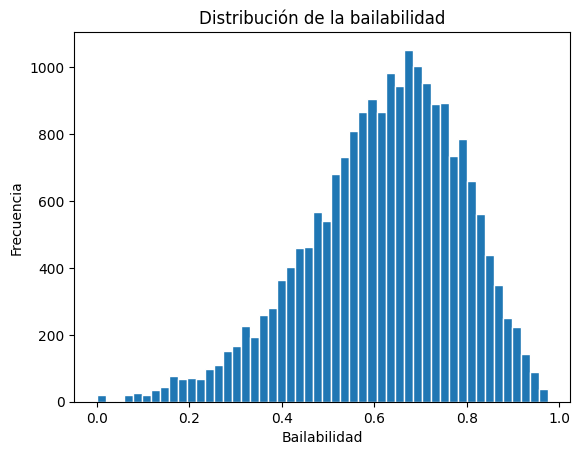

In [65]:
# Hacemos un Histograma para ver los estadisticos de centralidad
plt.hist(dataset['Danceability'], bins=50, edgecolor='white')
plt.xlabel('Bailabilidad')
plt.ylabel('Frecuencia')
plt.title('Distribución de la bailabilidad')

In [90]:
#Análisis de asimetría
danceability_skewness = skew(dataset['Danceability'].dropna())
print("Asimetría de Danceability:", danceability_skewness)

Asimetría de Danceability: -0.5571049355965859


In [91]:
#Análisis de grado de homogeneidad
danceability_kurtosis = dataset['Danceability'].kurtosis()
print("Grado de homogeneidad:", danceability_kurtosis)

Grado de homogeneidad: 0.15170439605143837


Del análisis de asimetría y grado de homogeneidad, podemos decir que:
 - Una asimetría de -0.5571, indica que la variable se encuentra sesgada hacia la izquierda. Es decir, que la cola de la distribución se extiende más hacia la izquierda.
 - Un grado de homogeneidad de 0.1517, indica que la variable posee una distribución leptocúrtica. Es decir, que sugiere una distribución con picos mas altos y más datos en las colas.

Según el test Normal la variable no parece tener una distribución normal. p_valor = 5.684989890311657e-207 < 0.05
Según el test de Anderson-Darling la variable no parece tener una distribución normal. Estadistico= 90.58573602644174 > 0.787 para alpha de 5.0% 


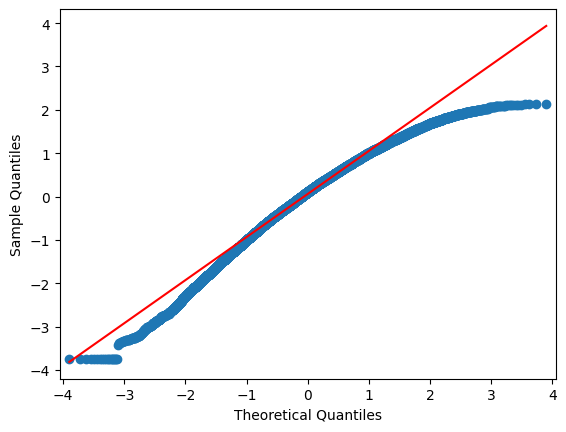

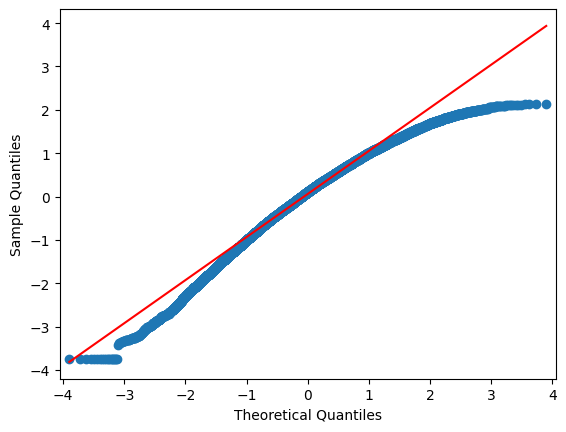

In [79]:
# Prueba de Normalidad de la Variable

# H0: Distribución de la variable = Distribución Normal
# H1: Distribución de la variable != Distribución Normal

#Test Normal
#Si el p_vallor es menor
nstatic,np_valor = normaltest(dataset['Danceability'])
if np_valor < 0.05:
    print(f"Según el test Normal la variable no parece tener una distribución normal. p_valor = {np_valor} < {0.05}")
else:
    print(f"Según el test Normal la variable parece tener una distribucion normal. p_valor = {np_valor} > {0.05}")

#Test Anderson
#Si el valor del estadístico de prueba es mayor que el valor crítico para un nivel de significancia específico, se rechaza la hipótesis nula y se concluye que los datos no siguen una distribución normal.
#Si el valor del estadístico de prueba es menor que el valor crítico para un nivel de significancia, no se rechaza la hipótesis nula y se puede asumir que los datos siguen una distribución normal.
astatic,ap_valor,alpha = anderson(dataset.Danceability)[0],anderson(dataset.Danceability)[1][2],anderson(dataset.Danceability)[2][2]
if astatic > ap_valor:
    print(f"Según el test de Anderson-Darling la variable no parece tener una distribución normal. Estadistico= {astatic} > {ap_valor} para alpha de {alpha}% ")
else:
    print(f"Según el test de Anderson-Darling la variable parece tener una distribucion normal. Estadistico= {astatic} < {ap_valor} para alpha de {alpha}% ")

#Graficamos
sm.qqplot(dataset['Danceability'],fit=True,line='q')

Podemos observar que los valores se alejan de la linea roja por lo que los datos de la variable no sigue una distribucion Normal

In [25]:
#Creamos un dataset con el top 10 de canciones mas bailables ordenadas por visualización
top10_bailabilidad= dataset.groupby(['Title','Danceability']).max().reset_index()
top10_bailabilidad= top10_bailabilidad[top10_bailabilidad['Danceability']>0.95].sort_values('Views', ascending=False).head(10)
top10_bailabilidad

,Title,Danceability,Artist,Track,Album,Album_type,Energy,Loudness,Speechiness,Acousticness,...,Channel,Views,Likes,Comments,Licensed,official_video,Stream,EnergyLiveness,most_playedon,Artista-Canción
6025,Five Little Ducks | Kids Songs | Super Simple ...,0.956,Super Simple Songs,Five Little Ducks,Baby Shark & More Kids Songs,album,0.340,-10.195,0.0487,0.0614,...,Super Simple Songs - Kids Songs,1.447813e+09,3463666.0,0.0,True,True,36270807.0,5.704698,Youtube,Five Little Ducks | Kids Songs | Super Simple ...
7501,If You're Happy | Super Simple Songs,0.968,Super Simple Songs,If You're Happy,The Bath Song & More Kids Songs,album,0.257,-10.953,0.0981,0.3250,...,Super Simple Songs - Kids Songs,8.892614e+08,1392353.0,0.0,True,True,29904583.0,2.763441,Youtube,If You're Happy | Super Simple Songs-Super Sim...
2466,"Black Eyed Peas, Shakira - GIRL LIKE ME (Offic...",0.965,Black Eyed Peas,GIRL LIKE ME,TRANSLATION,album,0.485,-8.784,0.1910,0.0206,...,BlackEyedPeasVEVO,6.625291e+08,5488829.0,222922.0,True,True,453923193.0,7.404580,Youtube,"Black Eyed Peas, Shakira - GIRL LIKE ME (Offic..."
15025,Sean Paul - Temperature (Official Video),0.951,Sean Paul,Temperature,The Trinity,album,0.600,-4.675,0.0685,0.1060,...,Atlantic Records,3.613149e+08,2124819.0,38673.0,True,True,590578908.0,8.426966,Spotify,Sean Paul - Temperature (Official Video)-Sean ...
8713,Justin Timberlake - SexyBack (Official Video) ...,0.967,Justin Timberlake,SexyBack (feat. Timbaland),FutureSex/LoveSounds,album,0.583,-5.562,0.0789,0.0584,...,justintimberlakeVEVO,2.661145e+08,1715168.0,41799.0,True,True,656261161.0,11.233141,Spotify,Justin Timberlake - SexyBack (Official Video) ...
15147,Shaggy - Hey Sexy Lady ft. Brian & Tony Gold (...,0.957,Shaggy,Hey Sexy Lady,Lucky Day,album,0.554,-6.618,0.0670,0.0052,...,ShaggyVEVO,2.016404e+08,1140621.0,14766.0,True,True,63853876.0,2.224900,Youtube,Shaggy - Hey Sexy Lady ft. Brian & Tony Gold (...
12417,Nelly - Hot In Herre (Official Music Video),0.956,Nelly,Hot In Herre,Nellyville,album,0.745,-4.753,0.1200,0.2060,...,NellyVEVO,1.793610e+08,1020227.0,27963.0,True,True,389070840.0,12.113821,Spotify,Nelly - Hot In Herre (Official Music Video)-Nelly
13781,"Quality Control, Lil Baby, & DaBaby - ""Baby"" (...",0.970,Lil Baby,Baby (Lil Baby feat. DaBaby),Quality Control: Control The Streets Volume 2,album,0.463,-7.259,0.3660,0.0957,...,QualityControlVEVO,1.348591e+08,1184063.0,29249.0,True,True,389570923.0,3.066225,Spotify,"Quality Control, Lil Baby, & DaBaby - ""Baby"" (..."
9406,L7NNON & BIEL DO FURDUNCINHO - Ai Preto ?? (pa...,0.953,L7NNON,Ai Preto,Ai Preto,single,0.570,-5.149,0.2450,0.5370,...,L7NNON,1.332315e+08,1073290.0,8770.0,True,True,140786187.0,5.740181,Spotify,L7NNON & BIEL DO FURDUNCINHO - Ai Preto ?? (pa...
17092,Timbaland - Give It To Me (Official Music Vide...,0.975,Timbaland,Give It To Me,Shock Value,album,0.711,-3.904,0.0632,0.1680,...,TimbalandVEVO,1.331471e+08,760396.0,17486.0,True,True,165286007.0,8.898623,Spotify,Timbaland - Give It To Me (Official Music Vide...


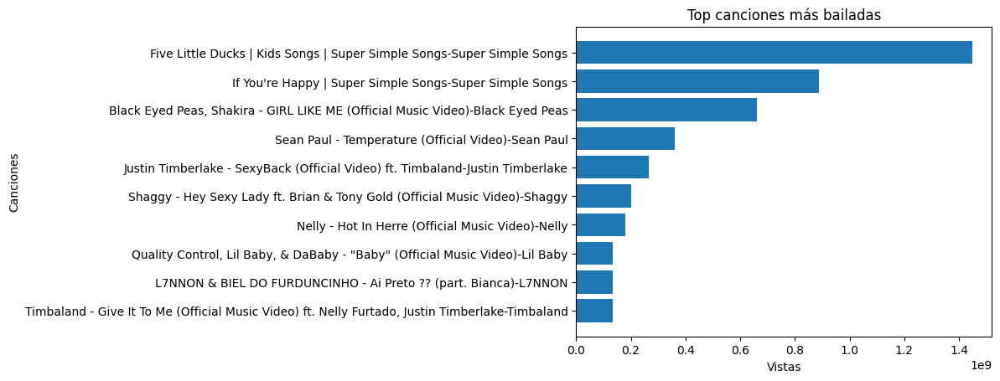

In [77]:
fig, ax = plt.subplots()

#Creamos las variables
bailabilidad_cancion= top10_bailabilidad['Artista-Canción']
bailabilidad_vistas= top10_bailabilidad['Views']
#Ordenamos los valores en orden descendente
bailabilidad_cancion=bailabilidad_cancion[::-1]
bailabilidad_vistas=bailabilidad_vistas[::-1]
#Descripción del gráfico
ax.set_xlabel('Vistas')
ax.set_ylabel('Canciones')
ax.set_title('Top canciones más bailadas')
#Graficamos
ax.barh(bailabilidad_cancion, bailabilidad_vistas)
plt.show()

([<matplotlib.patches.Wedge at 0x2a5a3628050>,
 [Text(-0.34032875960084547, 1.0460288406103104, 'Spotify'),
  Text(0.3403287596008451, -1.0460288406103107, 'Youtube')],
 [Text(-0.18563386887318842, 0.570561185787442, '60.01%'),
  Text(0.18563386887318822, -0.5705611857874421, '39.99%')])

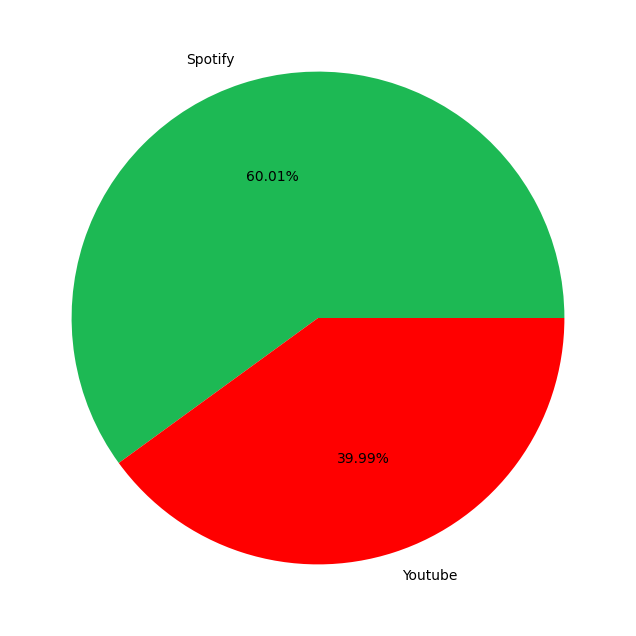

In [61]:
color_plataforma=["#1DB954","#FF0000"]

#Piechart suma de bailabilidad por plataforma
bailabilidad_plataforma=top10_bailabilidad.groupby('most_playedon')['Danceability'].sum().reset_index()
fix,ax = plt.subplots(figsize=(12,8))
ax.pie(bailabilidad_plataforma['Danceability'], labels = bailabilidad_plataforma['most_playedon'], autopct='%.2f%%', colors=color_plataforma)


 * *Energy*: Muestra la intensidad y actividad percibida en una canción. Canciones más enérgicas y vigorosas se identifican por valores más altos.

In [92]:
#Descripción estadística de la varible
dataset['Energy'].describe()

count    20594.000000
mean         0.635176
std          0.214274
min          0.000000
25%          0.507000
50%          0.666000
75%          0.798000
max          1.000000
Name: Energy, dtype: float64

In [93]:
#Detallamos las canciones con mayor bailabilidad
energia= (dataset.groupby(['Track','Artist'])[['Energy']].max()).sort_values(by='Energy', ascending=False).head(10)
energia

,,Energy
Track,Artist,
"Rain and Thunderstorm, Pt. 3",Rain Fruits Sounds,1.000
Gentle Piano Melodies,Sleepy Penguin,1.000
"Rain and Thunderstorm, Pt. 7",Rain Fruits Sounds,1.000
"Rain and Thunderstorm, Pt. 6",Rain Fruits Sounds,1.000
"Rain and Thunderstorm, Pt. 4",Rain Fruits Sounds,1.000
"Rain and Thunderstorm, Pt. 33",Rain Fruits Sounds,1.000
"Rain and Thunderstorm, Pt. 37",Rain Fruits Sounds,0.999
Soothing Baby White Nosie,Sleepy Penguin,0.998
Voodoo People,The Prodigy,0.998


Text(0.5, 1.0, 'Distribución de la energia')

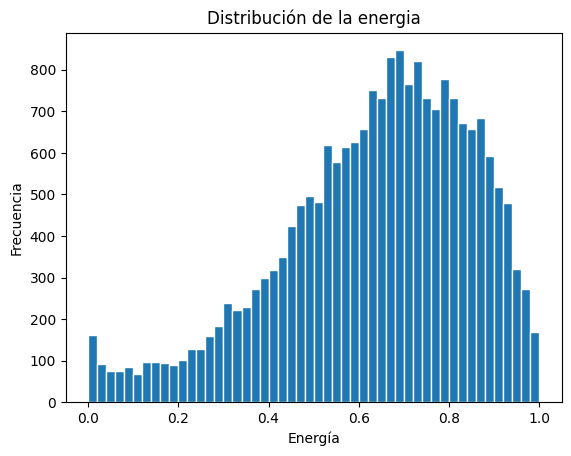

In [95]:
# Hacemos un Histograma para ver los estadisticos de centralidad
plt.hist(dataset['Energy'], bins=50, edgecolor='white')
plt.xlabel('Energía')
plt.ylabel('Frecuencia')
plt.title('Distribución de la energia')

In [97]:
#Análisis de asimetría
danceability_skewness = skew(dataset['Energy'].dropna())
print("Asimetría de energia:", danceability_skewness)

Asimetría de energia: -0.7175397734475439


In [100]:
#Análisis de grado de homogeneidad
energy_kurtosis = dataset['Energy'].kurtosis()
print("Grado de homogeneidad:", energy_kurtosis)

Grado de homogeneidad: 0.14408654163035184


Según el test Normal la variable no parece tener una distribución normal. p_valor = 0.0 < 0.05
Según el test de Anderson-Darling la variable no parece tener una distribución normal. Estadistico= 189.3081247733935 > 0.787 para alpha de 5.0% 


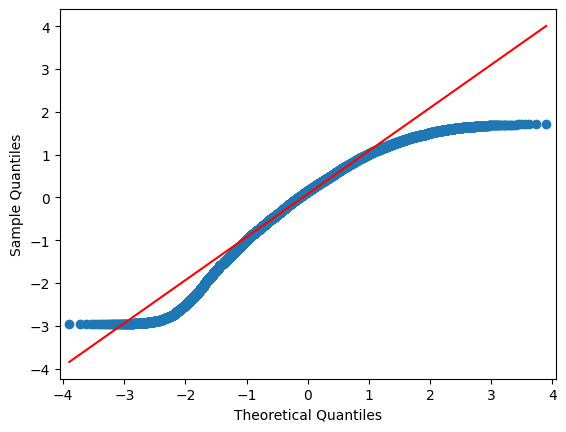

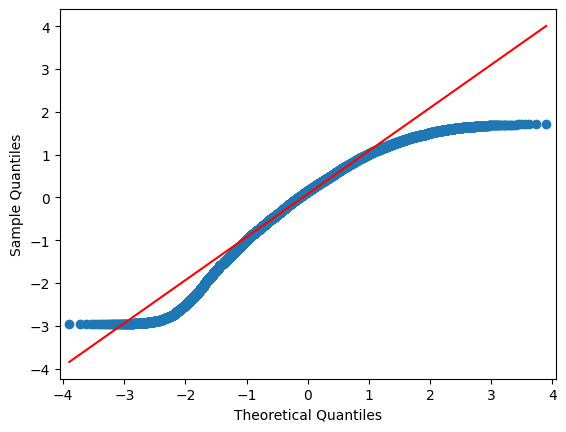

In [7]:
# Prueba de Normalidad de la Variable

# H0: Distribución de la variable = Distribución Normal
# H1: Distribución de la variable != Distribución Normal

#Test Normal
#Si el p_vallor es menor
nstatic,np_valor = normaltest(dataset['Energy'])
if np_valor < 0.05:
    print(f"Según el test Normal la variable no parece tener una distribución normal. p_valor = {np_valor} < {0.05}")
else:
    print(f"Según el test Normal la variable parece tener una distribucion normal. p_valor = {np_valor} > {0.05}")

#Test Anderson
#Si el valor del estadístico de prueba es mayor que el valor crítico para un nivel de significancia específico, se rechaza la hipótesis nula y se concluye que los datos no siguen una distribución normal.
#Si el valor del estadístico de prueba es menor que el valor crítico para un nivel de significancia, no se rechaza la hipótesis nula y se puede asumir que los datos siguen una distribución normal.
astatic,ap_valor,alpha = anderson(dataset.Energy)[0],anderson(dataset.Energy)[1][2],anderson(dataset.Energy)[2][2]
if astatic > ap_valor:
    print(f"Según el test de Anderson-Darling la variable no parece tener una distribución normal. Estadistico= {astatic} > {ap_valor} para alpha de {alpha}% ")
else:
    print(f"Según el test de Anderson-Darling la variable parece tener una distribucion normal. Estadistico= {astatic} < {ap_valor} para alpha de {alpha}% ")

#Graficamos
sm.qqplot(dataset['Energy'],fit=True,line='q')

Luego de analizar la variable *Energy*, podemos concluir que los valores se alejan de la linea roja por ende los datos de la variable no sigue una distribucion Normal

In [12]:
#Creamos un dataset con el top 10 de canciones con mas energía ordenadas por visualización
top10_energia= dataset.groupby(['Title','Energy']).max().reset_index()
top10_energia= top10_energia[top10_energia['Energy']>0.95].sort_values('Views', ascending=False).head(10)
top10_energia

,Title,Energy,Artist,Track,Album,Album_type,Danceability,Loudness,Speechiness,Acousticness,...,Channel,Views,Likes,Comments,Licensed,official_video,Stream,EnergyLiveness,most_playedon,Artista-Canción
5474,Eminem - Not Afraid,0.954,Eminem,Not Afraid,Recovery,album,0.855,-1.190,0.2640,0.52900,...,EminemVEVO,1.727241e+09,11425215.0,872181.0,True,True,7.899229e+08,4.653659,Youtube,Eminem - Not Afraid-Eminem
6499,Gente de Zona - La Gozadera (Official Video) f...,0.989,Gente De Zona,La Gozadera (feat. Marc Anthony),Visualízate,album,0.616,-1.698,0.0483,0.16600,...,GenteDeZonaVEVO,1.482722e+09,3734972.0,160233.0,True,True,5.170148e+08,5.750000,Youtube,Gente de Zona - La Gozadera (Official Video) f...
6961,Guns N' Roses - Sweet Child O' Mine (Official ...,0.952,Guns N' Roses,Sweet Child O' Mine,Appetite For Destruction,album,0.446,-5.321,0.0523,0.09010,...,GunsNRosesVEVO,1.479703e+09,7392749.0,231100.0,True,True,1.397611e+09,8.500000,Youtube,Guns N' Roses - Sweet Child O' Mine (Official ...
13562,Pitbull - Timber (Official Video) ft. Ke$ha,0.963,Pitbull,Timber (feat. Ke$ha),Global Warming: Meltdown (Deluxe Version),album,0.581,-4.087,0.0981,0.02950,...,PitbullVEVO,1.405540e+09,5671596.0,158456.0,True,True,1.120974e+09,6.928058,Youtube,Pitbull - Timber (Official Video) ft. Ke$ha-Pi...
14737,"SIMMBA: Aankh Marey | Ranveer Singh, Sara Ali ...",0.978,Mika Singh,"Aankh Marey (From ""Simmba"")","Aankh Marey (From ""Simmba"")",single,0.796,-1.266,0.0955,0.28900,...,T-Series,9.169826e+08,4160870.0,154872.0,True,True,4.662870e+07,2.826590,Youtube,"SIMMBA: Aankh Marey | Ranveer Singh, Sara Ali ..."
14742,SKRILLEX - Bangarang feat. Sirah [Official Mus...,0.972,Skrillex,Bangarang (feat. Sirah),Bangarang EP,single,0.716,-2.302,0.1960,0.01450,...,Skrillex,9.106602e+08,7111393.0,399310.0,True,True,4.168293e+08,3.066246,Youtube,SKRILLEX - Bangarang feat. Sirah [Official Mus...
6959,Guns N' Roses - Paradise City (Official Music ...,0.980,Guns N' Roses,Paradise City,Appetite For Destruction,album,0.268,-5.958,0.1030,0.01920,...,GunsNRosesVEVO,7.530865e+08,2651795.0,90901.0,True,True,8.428266e+08,5.384615,Spotify,Guns N' Roses - Paradise City (Official Music ...
3671,Chogada With Lyrics | Loveyatri | Aayush Shar...,0.972,Darshan Raval,"Chogada (From ""Loveyatri"")","Chogada (From ""Loveyatri"")",single,0.359,-3.452,0.1090,0.13600,...,T-Series,6.749870e+08,3202388.0,75318.0,True,True,5.189965e+07,6.942857,Youtube,Chogada With Lyrics | Loveyatri | Aayush Shar...
6290,Full Song: O SAKI SAKI | Batla House | Nora Fa...,0.961,Vishal-Shekhar,"O Saki Saki (From ""Batla House"")","O Saki Saki (From ""Batla House"")",single,0.737,-0.155,0.0747,0.16300,...,T-Series,6.677483e+08,3251861.0,61929.0,True,True,9.823902e+07,2.662050,Youtube,Full Song: O SAKI SAKI | Batla House | Nora Fa...
1721,Armin van Buuren - Blah Blah Blah (Official Ly...,0.963,Armin van Buuren,Blah Blah Blah,Balance,album,0.612,-3.912,0.0531,0.00897,...,Armin van Buuren,6.521189e+08,4918388.0,103056.0,True,True,4.318977e+08,3.275510,Youtube,Armin van Buuren - Blah Blah Blah (Official Ly...


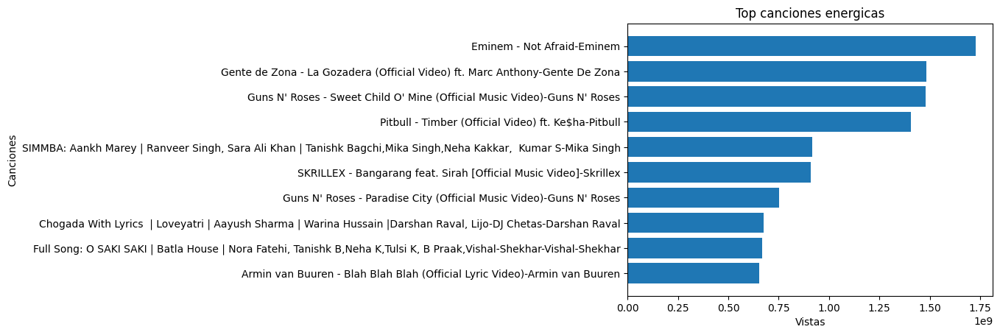

In [13]:
fig, ax = plt.subplots()

#Creamos las variables
energia_cancion= top10_energia['Artista-Canción']
energia_vistas= top10_energia['Views']
#Ordenamos los valores en orden descendente
energia_cancion=energia_cancion[::-1]
energia_vistas=energia_vistas[::-1]
#Descripción del gráfico
ax.set_xlabel('Vistas')
ax.set_ylabel('Canciones')
ax.set_title('Top canciones energicas')
#Graficamos
ax.barh(energia_cancion, energia_vistas)
plt.show()

([<matplotlib.patches.Wedge at 0x2a5a3c95950>,
 [Text(1.0891371809349477, 0.15420830426755555, 'Spotify'),
  Text(-1.0891371809349477, -0.1542083042675554, 'Youtube')],
 [Text(0.5940748259645169, 0.08411362050957576, '4.48%'),
  Text(-0.5940748259645169, -0.08411362050957567, '95.52%')])

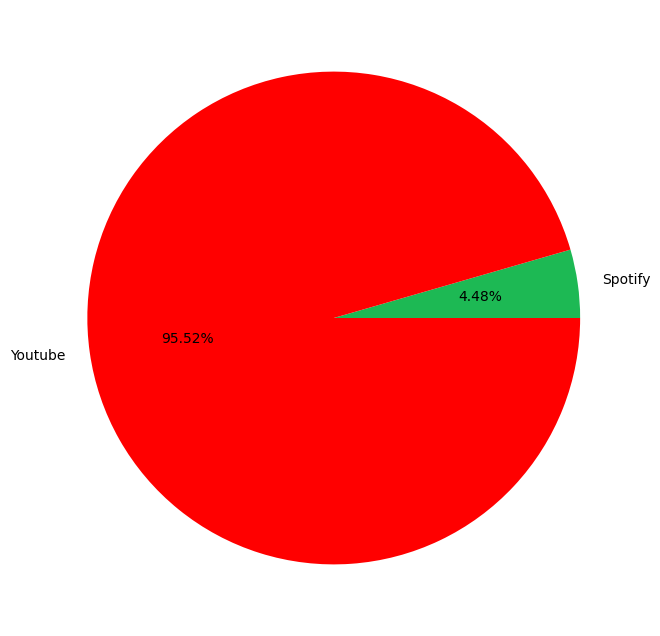

In [62]:
color_plataforma=["#1DB954","#FF0000"]

#Piechart suma de bailabilidad por plataforma
energia_plataforma=top10_energia.groupby('most_playedon')['Danceability'].sum().reset_index()
fix,ax = plt.subplots(figsize=(12,8))
ax.pie(energia_plataforma['Danceability'], labels = energia_plataforma['most_playedon'], autopct='%.2f%%', colors=color_plataforma)

## Análisis multivariado

<Figure size 768x576 with 0 Axes>

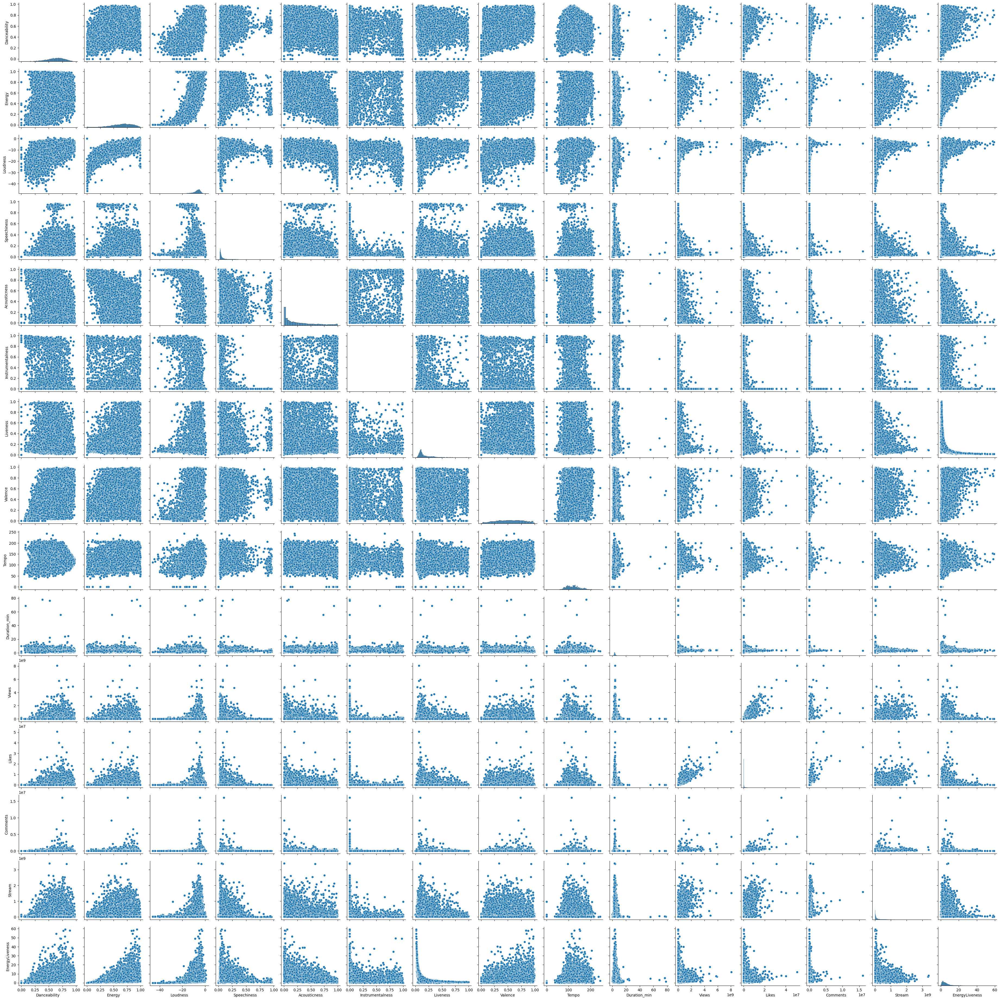

In [27]:
#Crear un Pairplot del dataset
plt.figure(dpi=120)
sns.pairplot(dataset)
plt.show()

<Figure size 768x576 with 0 Axes>

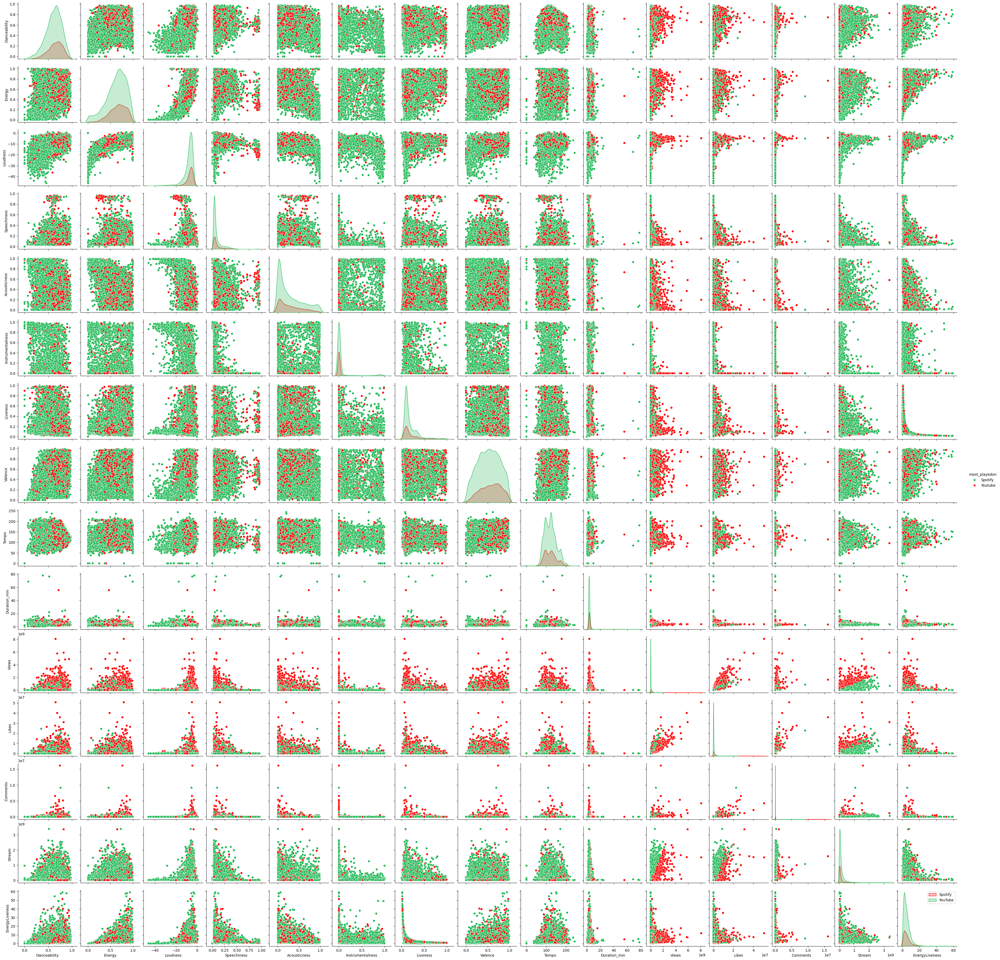

In [28]:
#Crear el Pairplot pero ahora con el atributo hue = plataforma. Las leyendas deberán decir: 'Spotify','Youtube'
color_plataforma=["#1DB954","#FF0000"]

plt.figure(dpi = 120)
sns.pairplot(dataset,hue = 'most_playedon',palette = color_plataforma)
plt.legend(['Spotify','YouTube'])
plt.show()

Correlaciones

In [29]:
#Incluimos solo las variables númericas
variables_numericas = dataset.select_dtypes(include=[np.number])
dataset_corr = abs(variables_numericas.corr("spearman"))

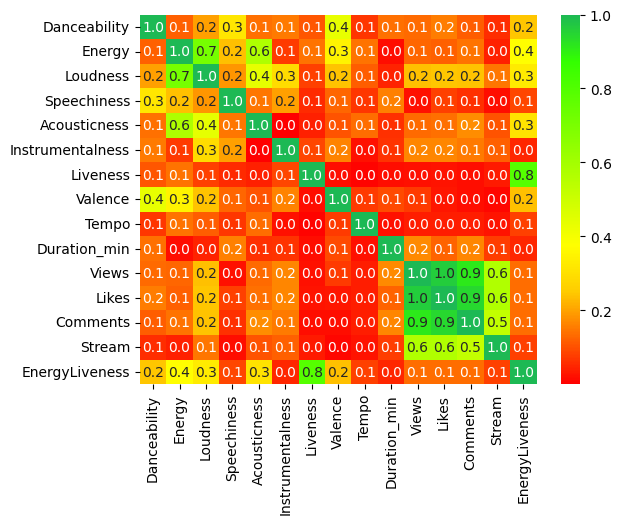

In [30]:
#Hacemos un gráfico de correlación con todas las variables numéricas del Df
sns.heatmap(dataset_corr, annot=True, cmap=color_map, fmt="0.1f");

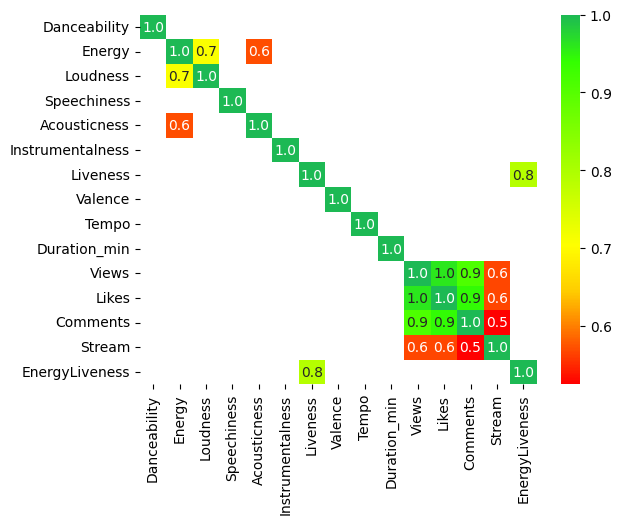

In [32]:
#Establecemos un umbral de relevancia de la correlación
umbral = 0.5
#Filtramos las correlaciones significativas
correlaciones_significativas = dataset_corr[(dataset_corr > umbral) | (dataset_corr< -umbral)]
#Vemos la correlación que hay entre las variables
sns.heatmap(correlaciones_significativas, annot=True, cmap=color_map, fmt="0.1f");

# Preprocesamiento

In [42]:
df_vnumericas = variaciones_numericas.copy()
df_vnumericas_normales = df_vnumericas[['Danceability', 'Energy', 'Liveness', 'Valence', 'Duration_min']]
df_vnumericas_normales.head(3)

,Danceability,Energy,Liveness,Valence,Duration_min
0,0.818,0.705,0.6130,0.772,3.710667
1,0.676,0.703,0.0463,0.852,3.336217
2,0.695,0.923,0.1160,0.551,3.585833


In [43]:
dataset_preprocesamiento = df_vnumericas_normales.copy()
dataset_preprocesamiento_z = pd.DataFrame()
for j in dataset_preprocesamiento.columns[0:]:
    dataset_preprocesamiento_z[j] = (dataset_preprocesamiento[j].mean()) / dataset_preprocesamiento[j].std()
dataset_preprocesamiento_z.head()

,Danceability,Energy,Liveness,Valence,Duration_min


In [44]:
dataset_preprocesamiento['Danceability'] = dataset_preprocesamiento_z['Danceability'].apply(lambda x: dataset_preprocesamiento['Danceability'].mean() if (x>2 or x<-2) else x)
dataset_preprocesamiento['Energy']= dataset_preprocesamiento_z['Energy'].apply(lambda x: dataset_preprocesamiento['Energy'].mean() if (x>2 or x<-2) else x)
dataset_preprocesamiento['Liveness']= dataset_preprocesamiento_z['Liveness'].apply(lambda x: dataset_preprocesamiento['Liveness'].mean() if (x>2 or x<-2) else x)
dataset_preprocesamiento['Valence']= dataset_preprocesamiento_z['Valence'].apply(lambda x: dataset_preprocesamiento['Valence'].mean() if (x>2 or x<-2) else x)
dataset_preprocesamiento['Duration_min']= dataset_preprocesamiento_z['Duration_min'].apply(lambda x: dataset_preprocesamiento['Duration_min'].mean() if (x>2 or x<-2) else x)

dataset_preprocesamiento_z.head()

,Danceability,Energy,Liveness,Valence,Duration_min


## Encodeo de variables categoricas

In [45]:
#Creamos copia de las variables categoricas 
df_vcategoricas = variaciones_categoricas.copy()
df_vcategoricas.head(3)

,Artist,Track,Album,Album_type,Title,Channel,Licensed,official_video,most_playedon
0,Gorillaz,Feel Good Inc.,Demon Days,album,Gorillaz - Feel Good Inc. (Official Video),Gorillaz,True,True,Spotify
1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,Gorillaz,True,True,Spotify
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,Gorillaz - New Gold ft. Tame Impala & Bootie B...,Gorillaz,True,True,Spotify


In [46]:
#Realizamos el encodeo de las variables categóricas
label_encoder= LabelEncoder()

for columna in df_vcategoricas:
    label_encoder.fit(df_vcategoricas[columna])
    df_vcategoricas[columna] = label_encoder.transform(df_vcategoricas[columna])

df_vcategoricas.head()


,Artist,Track,Album,Album_type,Title,Channel,Licensed,official_video,most_playedon
0,686,4982,2637,0,6180,1997,2,2,0
1,686,12384,7751,0,6184,1997,2,2,0
2,686,10329,6933,2,6181,1997,2,2,0
3,686,10894,7751,0,6183,1997,2,2,0
4,686,2897,4139,0,6176,1997,2,2,1


# Escalada de variables

### Escalada variables normales

In [47]:
escalada_vnormales= df_vnumericas_normales.copy()

scaler_standard= StandardScaler()
for columna in escalada_vnormales:
    escalada_vnormales[columna]= scaler_standard.fit_transform(escalada_vnormales[[columna]])

vnormales = escalada_vnormales.copy()

In [12]:
vnormales.head(3)

,Danceability,Energy,Liveness,Valence,Duration_min
0,1.195758,0.325870,2.483870,0.985284,-0.015237
1,0.337753,0.316536,-0.872801,1.311101,-0.194816
2,0.452557,1.343283,-0.459955,0.085214,-0.075105


### Escalada variables no normales

In [48]:
df_vnumericas = variaciones_numericas.copy()
df_vnumericas_NoNormales = df_vnumericas[['Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Tempo', 'Views','Likes', 'Comments', 'Stream', 'EnergyLiveness']]
df_vnumericas_NoNormales.head(3)

,Loudness,Speechiness,Acousticness,Instrumentalness,Tempo,Views,Likes,Comments,Stream,EnergyLiveness
0,-6.679,0.1770,0.00836,0.002330,138.559,693555221.0,6220896.0,169907.0,1.040235e+09,1.150082
1,-5.815,0.0302,0.08690,0.000687,92.761,72011645.0,1079128.0,31003.0,3.100837e+08,15.183585
2,-3.930,0.0522,0.04250,0.046900,108.014,8435055.0,282142.0,7399.0,6.306347e+07,7.956897


In [49]:
escalada_vNoNormales = df_vnumericas_NoNormales.copy()

scaler_robust= RobustScaler()
for columna in escalada_vNoNormales:
    escalada_vNoNormales[columna]= scaler_robust.fit_transform(escalada_vNoNormales[[columna]])

vNoNormales= escalada_vNoNormales.copy()

In [50]:
vNoNormales.head(3)

,Loudness,Speechiness,Acousticness,Instrumentalness,Tempo,Views,Likes,Comments,Stream,EnergyLiveness
0,-0.035215,1.849927,-0.427853,4.913098,0.433268,10.319431,12.654636,12.520001,8.361207,-0.700385
1,0.184465,-0.299414,-0.245858,1.445024,-0.633550,0.890465,1.997631,2.100182,2.212791,2.463275
2,0.663743,0.022694,-0.348743,98.992253,-0.278247,-0.074007,0.345770,0.329539,0.132696,0.834118


### Preparación para entrenamiento

In [51]:
df_vcategoricas.reset_index(drop=True, inplace=True)
vnormales.reset_index(drop=True, inplace=True)
vNoNormales.reset_index(drop=True, inplace=True)

In [52]:
#Creamos un DF limpio
df_clean = pd.concat([df_vcategoricas, vnormales, vNoNormales], axis=1)
df_clean.reset_index(drop=True, inplace=True)

df_clean.head(3)

,Artist,Track,Album,Album_type,Title,Channel,Licensed,official_video,most_playedon,Danceability,...,Loudness,Speechiness,Acousticness,Instrumentalness,Tempo,Views,Likes,Comments,Stream,EnergyLiveness
0,686,4982,2637,0,6180,1997,2,2,0,1.195758,...,-0.035215,1.849927,-0.427853,4.913098,0.433268,10.319431,12.654636,12.520001,8.361207,-0.700385
1,686,12384,7751,0,6184,1997,2,2,0,0.337753,...,0.184465,-0.299414,-0.245858,1.445024,-0.633550,0.890465,1.997631,2.100182,2.212791,2.463275
2,686,10329,6933,2,6181,1997,2,2,0,0.452557,...,0.663743,0.022694,-0.348743,98.992253,-0.278247,-0.074007,0.345770,0.329539,0.132696,0.834118


Agrupamos las variables categóricas,númericas normales y no normales, para crear una nueva base integra y limpia. Es decir, libre de valores nulos, outliers,encodeada y escalada

## Análisis de dependencia

In [53]:
#Creamos X e Y
x = df_clean.drop(columns=['Views'], axis=1)
y = df_clean['Views']

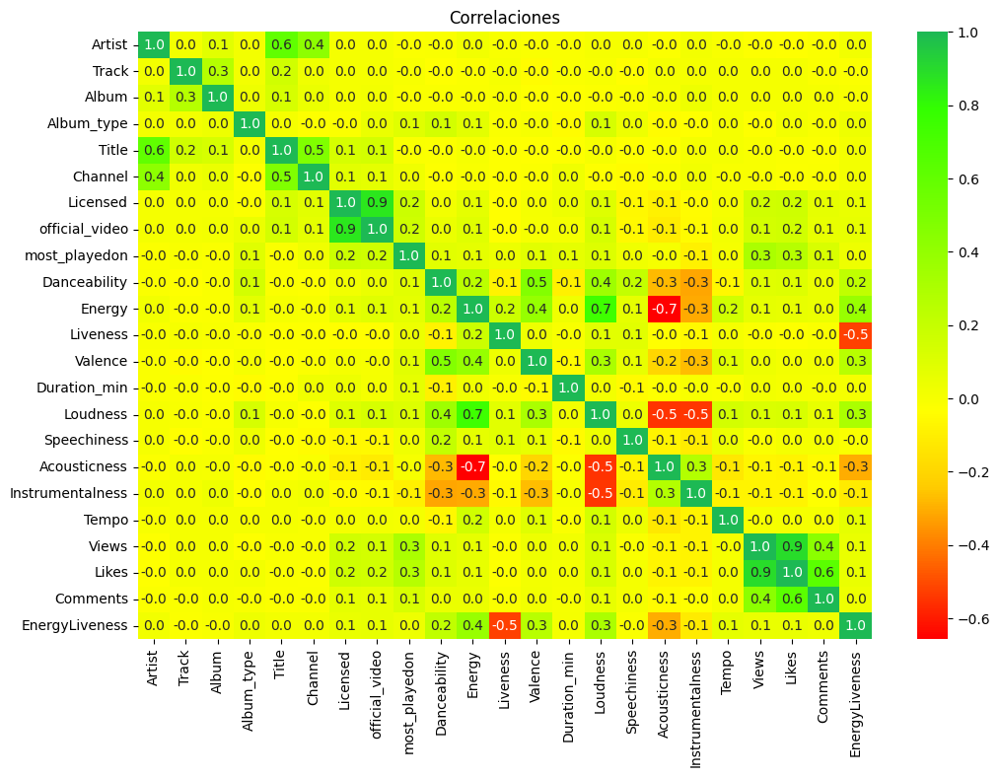

In [44]:
#Visualizaremos las correlaciones
plt.figure(figsize=(12, 8))
df_clean_corr = x.corr()
sns.heatmap(df_clean_corr, annot=True, cmap=color_map, fmt="0.1f")
plt.title('Correlaciones')
plt.show()

En el mapa de correlación se puede observar que hay variables que son dependientes de otras, por tal motivo debemos eliminarlas para realizar el análisis de regresión.
Las variables dependientes son:
 - Artist-Title
 - Loudness-Energy
 - Likes - Comments

In [54]:
vdependientes_delete= ['Artist', 'Loudness', 'Comments']
x.drop(vdependientes_delete, axis=1, inplace=True)

In [55]:
#Varaibles de entrenamiento y prueba
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42)

print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(16475, 20)
(4119, 20)
(16475,)
(4119,)


Ya que al momento de entrenar los modelos, me han surgido varios errores por tener valores faltantes. creamos un SimpleImputer para rellenar los mismos

In [56]:
#Llenamos los valores faltantes con la media de  cada variable
imputer = SimpleImputer(strategy='mean')

#Ajustamos elimputer a los datos de entrenamiento
imputer.fit(x_train)

#Transformamos los conjuntos de entrenamiento y prueba
x_train_imputed = imputer.transform(x_train)
x_test_imputed = imputer.transform(x_test)

In [58]:
rf_i= RandomForestRegressor()
rf_i.fit(x_train_imputed, y_train)

RandomForestRegressor()

In [57]:
#Escalamos los datos del entrenamiento con StandardScaler
std_scaler = StandardScaler()
std_scaler.fit(x_train_imputed)
x_train_stdscaler = std_scaler.transform(x_train_imputed)
x_test_stdscaler = std_scaler.transform(x_test_imputed)


In [67]:
# Convertir el arreglo numpy a DataFrame de Pandas
x_train_imputed_df = pd.DataFrame(x_train_imputed)

# Obtener los nombres de las características
nombres_caracteristicas = x_train_imputed_df.columns


In [68]:
# Obtener la importancia de las características del modelo
importancias = rf_i.feature_importances_

# Ordenar las características por importancia
indices_ordenados = np.argsort(importancias)[::-1]

# Mostrar las características y sus importancias
for i in range(len(nombres_caracteristicas)):
    print(f"{nombres_caracteristicas[indices_ordenados[i]]}: {importancias[indices_ordenados[i]]}")


17: 0.8211163315287631
18: 0.035868084962448914
7: 0.02737298316814853
11: 0.02269433192378305
12: 0.01429837277460329
16: 0.010361164556859488
1: 0.006626463719606377
13: 0.0065850349617203275
14: 0.0064985289743668476
8: 0.006350677401574642
9: 0.00624293710487005
3: 0.006207268717802548
4: 0.005958597059327945
10: 0.0055716465134058165
0: 0.0051066317938819146
15: 0.004636251760755016
19: 0.004551484597438865
2: 0.0037078162574975845
5: 0.00018151667277797943
6: 6.38755503676885e-05


# Feature Selection 

In [59]:
sfs = SFS(LinearRegression(),
          k_features=4, 
          forward=True,
          floating=False,
          scoring = 'r2', 
          cv = 5)

In [61]:
sfs.fit(x_train_imputed, y_train)
sfs.k_feature_names_

('2', '7', '17', '18')

In [63]:
x_train_selected = sfs.transform(x_train_imputed)
x_test_selected = sfs.transform(x_test_imputed)

## Modelo de regresión Lineal

In [64]:
#Entrenamos los datos escalados
linear_model_scal = LinearRegression()
linear_model_scal.fit(x_train_stdscaler, y_train)

LinearRegression()

In [72]:
linear_model = LinearRegression()
linear_model.fit(x_train_imputed, y_train)

LinearRegression()

In [76]:
ridge_model = Ridge()
ridge_model.fit(x_train_imputed,y_train)

Ridge()

In [79]:
rf_scal = RandomForestRegressor()
rf_scal.fit(x_train_stdscaler,y_train)

In [65]:
#Creamos el modelo
lr = LinearRegression() 
#Se ajusta el modelo con variables de entrenamiento
lr.fit(x_train_selected, y_train) 
#Predicción sobre la variable de PRUEBA
y_pred = lr.predict(x_test_selected) 

## Métricas de regresión

### Evaluación de modelos

In [73]:
# Funcion de Valoración de los modelos
def valoracion_modelos(tipo, modelo, Xtest, ytest):
    y_pred = modelo.predict(Xtest)
    print("R2_score",tipo, r2_score(ytest , y_pred))
    print("MAE", tipo, mean_absolute_error(ytest, y_pred))
    print("MSE",tipo, mean_squared_error(ytest, y_pred))
    print("MAPE",tipo,np.mean(np.abs((ytest-y_pred)/ytest)) * 100)

In [ ]:
valoracion_modelos("linear_model",linear_model, x_test_imputed, y_test )

In [ ]:
valoracion_modelos("linear_model_scal",linear_model_scal, x_test_stdscaler, y_test )

In [ ]:
valoracion_modelos("Ridge",ridge_model, X_test, y_test )

## Validación cruzada

In [ ]:
scores = cross_val_score(lr, x, y, cv=5, scoring='neg_mean_squared_error')

print("Mean Squared Error (MSE) scores:", -scores)
print("Mean MSE:", -scores.mean())